# **Importing all necessary libraries**

In [ ]:
import warnings
warnings.simplefilter('ignore')
import datetime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf

2024-04-22 07:14:48.263697: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-22 07:14:48.263796: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-22 07:14:48.374002: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# **Univariate data**

## **Importing dataset**

In [ ]:
df=pd.read_csv('/kaggle/input/alternative/tcs_stock.csv')
df=df[['Date','Close']]
df['Date']=pd.to_datetime(df['Date'])
display(df)

,Date,Close
0,2015-01-01,2545.55
1,2015-01-02,2579.45
2,2015-01-05,2540.25
3,2015-01-06,2446.60
4,2015-01-07,2417.70
...,...,...
243,2015-12-24,2434.25
244,2015-12-28,2462.70
245,2015-12-29,2455.80
246,2015-12-30,2418.30


## **Visualizing time series**

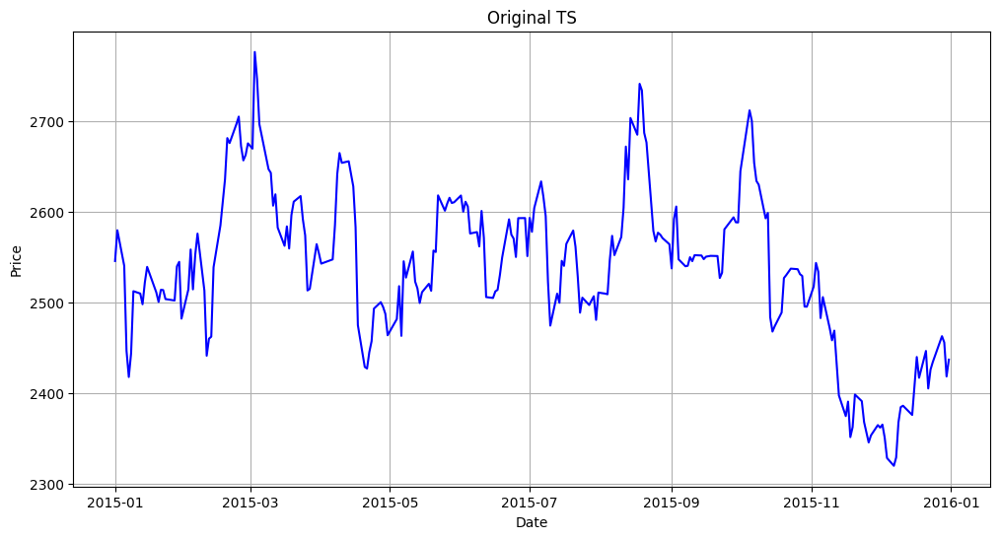

In [ ]:
fig=plt.figure(figsize=(12,6))
ax=fig.add_subplot(1,1,1)
ax.set_title('Original TS')
ax.set_xlabel('Date')
ax.set_ylabel('Price')
ax.grid()
ax.plot(df.set_index('Date'),color='b')
plt.show()

## **Filling missed values**

In [ ]:
dates=[]
start=datetime.date(2015,1,1)
end=datetime.date(2015,12,31)
for i in range((end-start).days+1):
    dates.append(start+datetime.timedelta(days=i))
df_=pd.DataFrame(columns=['Date'],data=dates)
df_['Date']=pd.to_datetime(df_['Date'])
df=df.merge(df_,how='right',on='Date')
display(df)

,Date,Close
0,2015-01-01,2545.55
1,2015-01-02,2579.45
2,2015-01-03,NaN
3,2015-01-04,NaN
4,2015-01-05,2540.25
...,...,...
360,2015-12-27,NaN
361,2015-12-28,2462.70
362,2015-12-29,2455.80
363,2015-12-30,2418.30


In [ ]:
for i in range(df.shape[0]):
    if df.loc[i,'Close']!=df.loc[i,'Close']:
        df.loc[i,'Close']=df.loc[i-1,'Close']
df['Close']=df['Close']
display(df)

,Date,Close
0,2015-01-01,2545.55
1,2015-01-02,2579.45
2,2015-01-03,2579.45
3,2015-01-04,2579.45
4,2015-01-05,2540.25
...,...,...
360,2015-12-27,2434.25
361,2015-12-28,2462.70
362,2015-12-29,2455.80
363,2015-12-30,2418.30


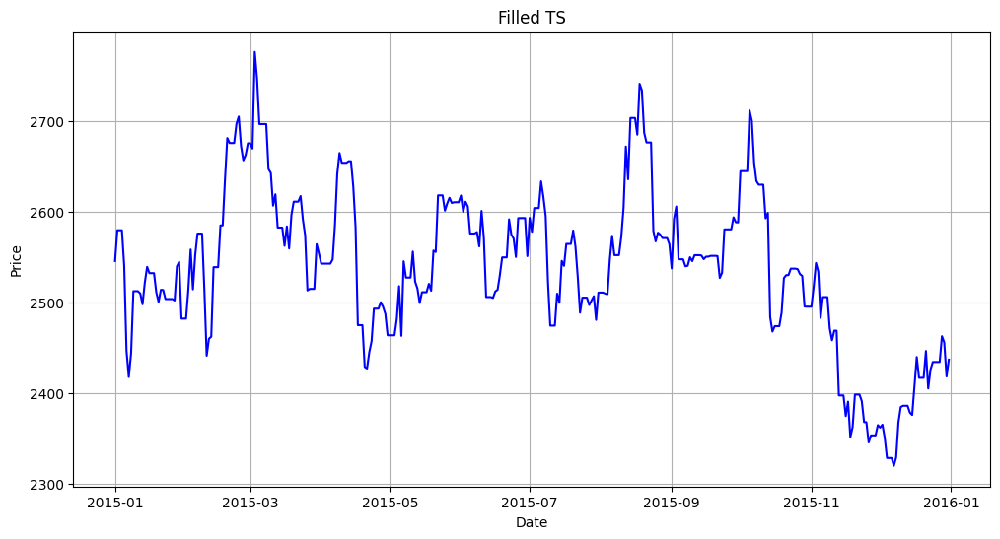

In [ ]:
fig=plt.figure(figsize=(12,6))
ax=fig.add_subplot(1,1,1)
ax.set_title('Filled TS')
ax.set_xlabel('Date')
ax.set_ylabel('Price')
ax.grid()
ax.plot(df.set_index('Date'),color='b')
plt.show()

## **Defining all global variables**

In [ ]:
n_features=1
n=df.shape[0]
train_ratio=0.75
n_train=int(train_ratio*n)
BATCH_SIZE=4
target_size=7
n_units=8
n_filters=32
n_length=7
EPOCHS=25
es=tf.keras.callbacks.EarlyStopping(monitor='loss',mode='min',patience=EPOCHS,restore_best_weights=True)

## **Saving values of time series into array**

In [ ]:
data=np.zeros(shape=(n,n_features))
data[:,0]=df['Close'].values
data[:7]

array([[2545.55],
       [2579.45],
       [2579.45],
       [2579.45],
       [2540.25],
       [2446.6 ],
       [2417.7 ]])

## **Splitting data on train and test**

In [ ]:
data_train,data_test=data[:n_train],data[n_train:]

## **Defining all necessary functions**

In [ ]:
def create_dataset(X,window_size,pred_size=target_size):
    t,n=X.shape
    X_slide=np.zeros((t-window_size-target_size+1,window_size+target_size,n))
    for i in range(X_slide.shape[0]):
        X_slide[i]=X[i:i+window_size+target_size]
    return X_slide[:,:window_size],X_slide[:,window_size:]

In [ ]:
def forecast(model,history,n_input):
    data=np.array(history)
    data=data.reshape((data.shape[0]*data.shape[1],data.shape[2]))
    input_x=data[-n_input:,:]
    input_x=input_x.reshape((1,input_x.shape[0],input_x.shape[1]))
    yhat=model(input_x)
    yhat=yhat[0]
    return yhat

In [ ]:
def forecast_convlstm(model,history,n_steps,n_length,n_input):
    data=np.array(history)
    data=data.reshape((data.shape[0]*data.shape[1],data.shape[2]))
    input_x=data[-n_input:, ]
    input_x=input_x.reshape((1,n_steps,1,n_length,data.shape[1]))
    yhat = model.predict(input_x, verbose=0)
    yhat = yhat[0]
    return yhat

In [ ]:
def evaluate_forecasts(actual,predicted):
    predicted=predicted.reshape(actual.shape)
    scores=[]
    for i in range(actual.shape[1]):
        rmse=(np.mean((actual[:,i]-predicted[:,i])**2))**0.5
        scores.append(rmse)
    s=0
    for row in range(actual.shape[0]):
        for col in range(actual.shape[1]):
            s+=(actual[row,col]-predicted[row,col])**2
    score=(s/(actual.shape[0]*actual.shape[1]))**0.5
    return score,scores

In [ ]:
def split_into_windows(data,sample):
    if sample=='train':
        return np.array(np.split(data[-(len(data)//target_size)*target_size:],(len(data)//target_size)))
    elif sample=='test':
        return np.array(np.split(data[:(len(data)//target_size)*target_size],(len(data)//target_size)))

In [ ]:
def evaluate_model(model,train,test,n_input):
    history=[x for x in split_into_windows(train,'train')]
    test=split_into_windows(test,'test')
    predictions=[]
    for i in range(len(test)):
        yhat_sequence=forecast(model,history,n_input)
        predictions.append(yhat_sequence)
        history.append(test[i,:])
    predictions=np.array(predictions)
    score,scores=evaluate_forecasts(test,predictions)
    fig=plt.figure(figsize=(12,6*target_size))
    for i in range(target_size):
        ax=fig.add_subplot(target_size,1,i+1)
        ax.set_title(f'Day {i+1}')
        ax.plot(test[:,i],color='c',label='real',marker='o')
        ax.plot(predictions[:,i],color='m',label='predicted',marker='o')
        ax.grid()
        ax.legend()
    plt.show()
    return score,scores

In [ ]:
def evaluate_model_convlstm(model,train,test,n_steps,n_length,n_input,n_output=target_size,evaluate_forecasts=evaluate_forecasts):
    history=[x for x in split_into_windows(train,'train')]
    test=split_into_windows(test,'test')
    predictions=[]
    for i in range(len(test)):
        yhat_sequence=forecast_convlstm(model,history,n_steps,n_length,n_input)
        predictions.append(yhat_sequence)
        history.append(test[i,:])
    predictions=np.array(predictions)
    score,scores=evaluate_forecasts(test, predictions)
    fig=plt.figure(figsize=(12,6*target_size))
    for i in range(target_size):
        ax=fig.add_subplot(target_size,1,i+1)
        ax.set_title(f'Day {i+1}')
        ax.plot(test[:,i],color='c',label='real',marker='o')
        ax.plot(predictions[:,i],color='m',label='predicted',marker='o')
        ax.grid()
        ax.legend()
    plt.show()
    return score, scores

In [ ]:
def plot_error_days(scores):
    fig=plt.figure()
    ax=fig.add_subplot()
    ax.set_ylabel('RMSE')
    ax.set_xlabel('Day')
    ax.grid()
    ax.plot([i for i in range(1,target_size+1)],scores,marker='o')
    plt.show()

In [ ]:
def single_layer_model(layer,wind_size,a=0.1):
    model=tf.keras.Sequential([tf.keras.layers.Conv1D(filters=n_filters,kernel_size=2,padding='same',activation=tf.keras.layers.LeakyReLU(a),input_shape=(wind_size,n_features)),
                               tf.keras.layers.MaxPooling1D(pool_size=2),
                               tf.keras.layers.Flatten(),
                               tf.keras.layers.RepeatVector(target_size),
                               layer(units=n_units,activation=tf.keras.layers.LeakyReLU(a),return_sequences=True),
                               tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(units=n_units,activation=tf.keras.layers.LeakyReLU(a))),
                               tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(units=n_features))])
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),loss='mse')
    return model

In [ ]:
def two_layers_model(layer,wind_size,a=0.1):
    model=tf.keras.Sequential([tf.keras.layers.Conv1D(filters=n_filters,kernel_size=2,padding='same',activation=tf.keras.layers.LeakyReLU(a),input_shape=(wind_size,n_features)),
                               tf.keras.layers.MaxPooling1D(pool_size=2),
                               tf.keras.layers.Conv1D(filters=2*n_filters,kernel_size=2,padding='same',activation=tf.keras.layers.LeakyReLU(a)),
                               tf.keras.layers.MaxPooling1D(pool_size=2),
                               tf.keras.layers.Flatten(),
                               tf.keras.layers.RepeatVector(target_size),
                               layer(units=n_units,activation=tf.keras.layers.LeakyReLU(a),return_sequences=True),
                               tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(units=n_units,activation=tf.keras.layers.LeakyReLU(a))),
                               tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(units=n_features))])
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),loss='mse')
    return model

In [ ]:
def convlstm_model(layer,n_length,n_steps,a=0.1):
    model=tf.keras.Sequential([tf.keras.layers.ConvLSTM2D(filters=n_filters,kernel_size=(1,2),padding='same',activation=tf.keras.layers.LeakyReLU(a),input_shape=(n_steps,1,n_length,n_features)),
                               tf.keras.layers.Flatten(),
                               tf.keras.layers.RepeatVector(target_size),
                               layer(units=n_units,activation=tf.keras.layers.LeakyReLU(a),return_sequences=True),
                               tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(units=n_units,activation=tf.keras.layers.LeakyReLU(a))),
                               tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(units=n_features))])
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),loss='mse')
    return model

In [ ]:
def convlstm_two_layers_model(layer,n_length,n_steps,a=0.1):
    model=tf.keras.Sequential([tf.keras.layers.ConvLSTM2D(filters=n_filters,kernel_size=(1,2),padding='same',activation=tf.keras.layers.LeakyReLU(a),return_sequences=True,input_shape=(n_steps,1,n_length,n_features)),
                               tf.keras.layers.ConvLSTM2D(filters=n_filters,kernel_size=(1,2),padding='same',activation=tf.keras.layers.LeakyReLU(a)),
                               tf.keras.layers.Flatten(),
                               tf.keras.layers.RepeatVector(target_size),
                               layer(units=n_units,activation=tf.keras.layers.LeakyReLU(a),return_sequences=True),
                               tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(units=n_units,activation=tf.keras.layers.LeakyReLU(a))),
                               tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(units=n_features))])
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),loss='mse')
    return model

## **Models with one convolutional layer**

### **LSTM**

#### **7 days**

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 7, 32)          │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 3, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 96)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector (RepeatVector)    │ (None, 7, 96)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 7, 8)           │         3,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed                │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_1              │ (None, 7, 1)           │             9 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,537 (13.82 KB)

 Trainable params: 3,537 (13.82 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 6537459.0000
Epoch 2/25


I0000 00:00:1713770104.828699      86 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6179159.0000
Epoch 3/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3898688.5000
Epoch 4/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 592877.1250
Epoch 5/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 529931.7500
Epoch 6/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 484966.8750
Epoch 7/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 450602.9688
Epoch 8/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 660152.1875
Epoch 9/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 509665.2188
Epoch 10/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 294198.9688
Epoch 11/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 189113.5156
Epoch 12/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 106546.9297
Epoch 13/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 57476.5664
Epoch 14/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 30865.0547
Epoch 15/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 15050.6934
Epoch 16/25
65/65 ━━━━━━━━

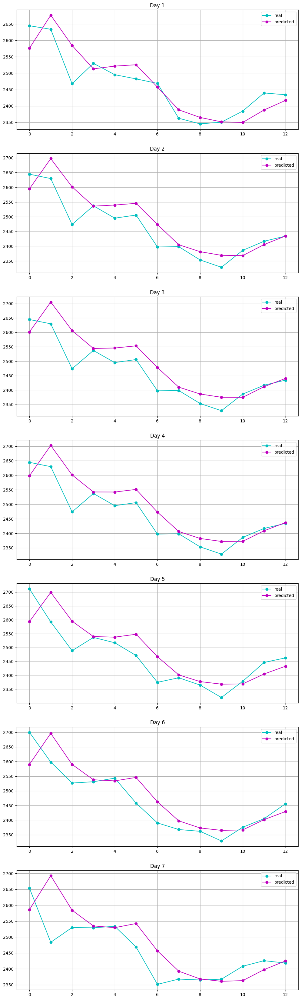

[58.45768705] 
 [46.71305201442349, 52.41179882694078, 55.50354929092786, 53.25181424638058, 66.08567246946049, 56.694396342700685, 74.12173739880687]


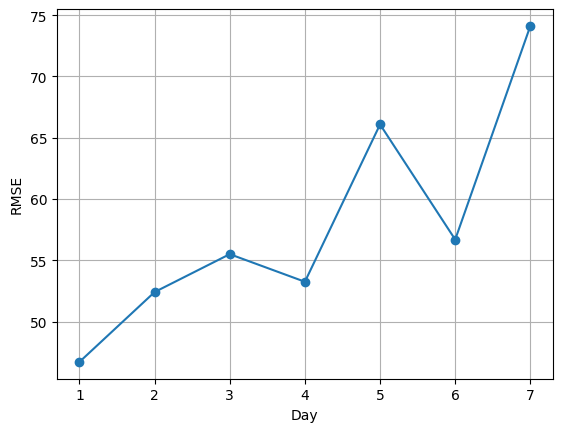

In [ ]:
n_input=7
model=single_layer_model(tf.keras.layers.LSTM,n_input)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es])
score,scores=evaluate_model(model,data_train,data_test,n_input)
print(score,'\n',scores)
plot_error_days(scores)

#### **14 days**

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_1 (Conv1D)               │ (None, 14, 32)         │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_1 (MaxPooling1D)  │ (None, 7, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 224)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_1 (RepeatVector)  │ (None, 7, 224)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 7, 8)           │         7,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_2              │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_3              │ (None, 7, 1)           │             9 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,633 (29.82 KB)

 Trainable params: 7,633 (29.82 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 3816514.5000
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 434842.9688
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 397280.4688
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 363754.4062
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 327221.8438
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 287637.0938
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241672.5938
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 198810.8125
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 165866.0156
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 141799.9688
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 121714.8828
Epoch 12/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 122424.9375
Epoch 13/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 91053.2656
Epoch 14/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 76898.5469
Epoch 15/25
64/

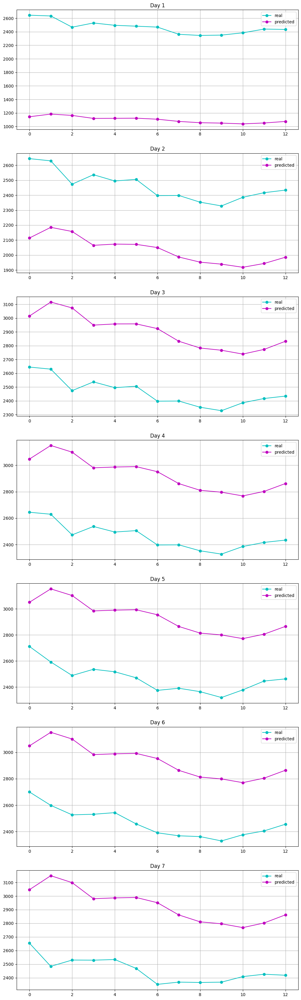

[671.7269055] 
 [1365.5420610596823, 431.09115201681715, 444.58245315684627, 473.8129848531363, 475.94372926978764, 473.6369821799293, 484.73479401346833]


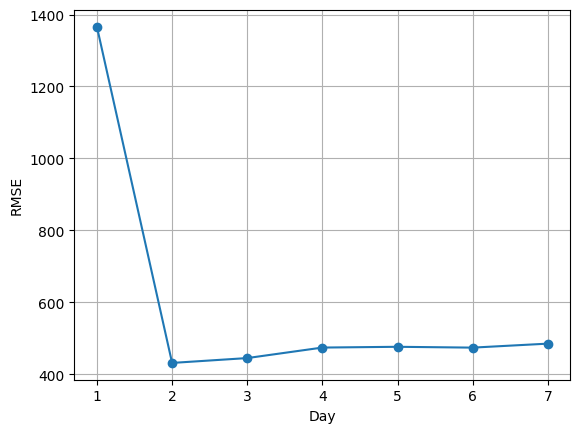

In [ ]:
n_input=14
model=single_layer_model(tf.keras.layers.LSTM,n_input)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es])
score,scores=evaluate_model(model,data_train,data_test,n_input)
print(score,'\n',scores)
plot_error_days(scores)

### **GRU**

#### **7 days**

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_2 (Conv1D)               │ (None, 7, 32)          │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_2 (MaxPooling1D)  │ (None, 3, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 96)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_2 (RepeatVector)  │ (None, 7, 96)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru (GRU)                       │ (None, 7, 8)           │         2,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_4              │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_5              │ (None, 7, 1)           │             9 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,721 (10.63 KB)

 Trainable params: 2,721 (10.63 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 6580980.5000
Epoch 2/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6558549.5000
Epoch 3/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6564484.0000
Epoch 4/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6588291.5000
Epoch 5/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6556690.5000
Epoch 6/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6602845.0000
Epoch 7/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6588506.5000
Epoch 8/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6594256.5000
Epoch 9/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6560662.0000
Epoch 10/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6553816.5000
Epoch 11/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6554853.0000
Epoch 12/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6562653.5000
Epoch 13/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6544341.0000
Epoch 14/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6540036.0000
E

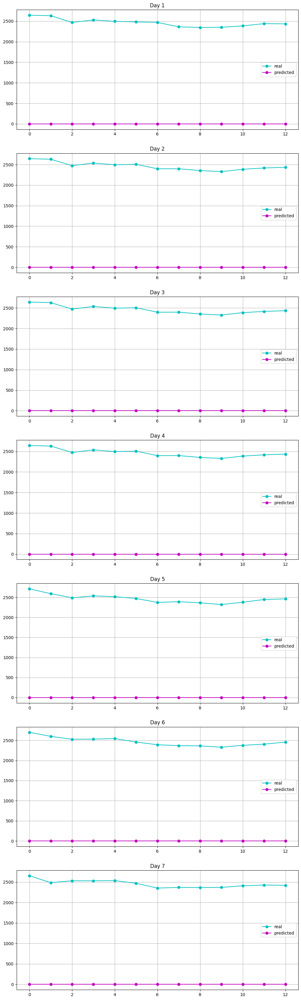

[2463.78984817] 
 [2466.255676645137, 2463.276074735481, 2463.276074735481, 2463.276074735481, 2467.8616091046433, 2467.028172254855, 2455.5345372327215]


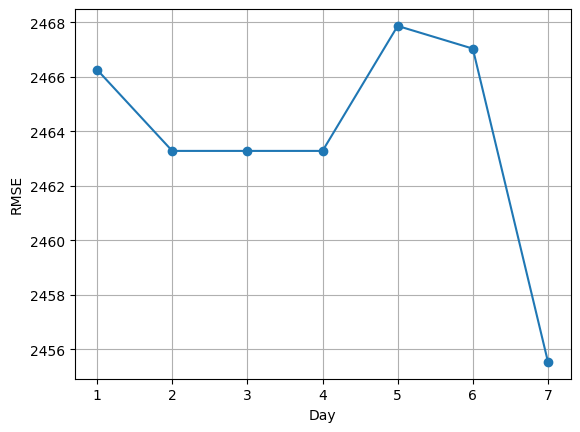

In [ ]:
n_input=7
model=single_layer_model(tf.keras.layers.GRU,n_input)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es])
score,scores=evaluate_model(model,data_train,data_test,n_input)
print(score,'\n',scores)
plot_error_days(scores)

#### **14 days**

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_3 (Conv1D)               │ (None, 14, 32)         │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_3 (MaxPooling1D)  │ (None, 7, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 224)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_3 (RepeatVector)  │ (None, 7, 224)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_1 (GRU)                     │ (None, 7, 8)           │         5,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_6              │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_7              │ (None, 7, 1)           │             9 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,793 (22.63 KB)

 Trainable params: 5,793 (22.63 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 7289893.5000
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4778784.5000
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 734146.8750
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6493.8193
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4830.7856
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5081.9087
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4937.2788
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4735.4849
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4520.7300
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4704.5386
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4817.3589
Epoch 12/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4701.0166
Epoch 13/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5503.6880
Epoch 14/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4852.5381
Epoch 15/25
64/64 ━━━━━━━━━━━━━━━━

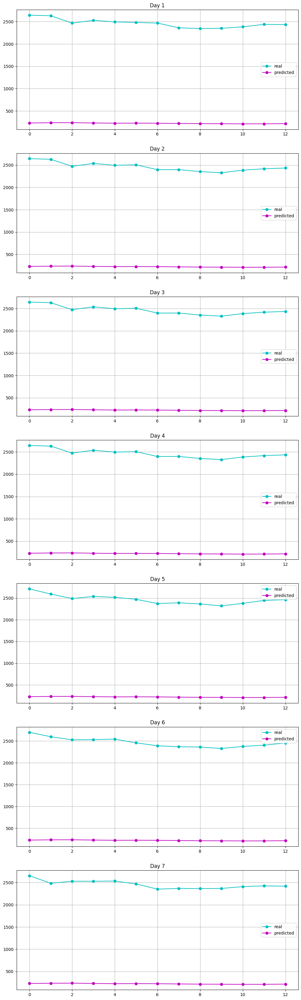

[2241.55346818] 
 [2244.218137688095, 2241.484686776202, 2240.8723818195713, 2240.898445424483, 2245.5272434821436, 2244.663558282081, 2233.1867451764]


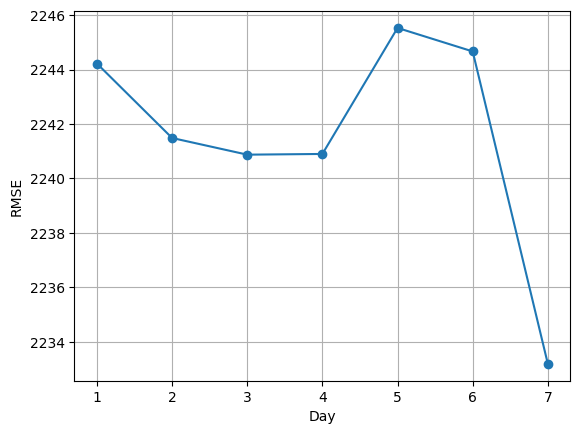

In [ ]:
n_input=14
model=single_layer_model(tf.keras.layers.GRU,n_input)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es])
score,scores=evaluate_model(model,data_train,data_test,n_input)
print(score,'\n',scores)
plot_error_days(scores)

## **Models with two convolutional layers**

### **LSTM**

#### **7 days**

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_4 (Conv1D)               │ (None, 7, 32)          │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_4 (MaxPooling1D)  │ (None, 3, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_5 (Conv1D)               │ (None, 3, 64)          │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_5 (MaxPooling1D)  │ (None, 1, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_4 (RepeatVector)  │ (None, 7, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 7, 8)           │         2,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_8              │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_9              │ (None, 7, 1)           │             9 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,673 (26.07 KB)

 Trainable params: 6,673 (26.07 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 6426827.0000
Epoch 2/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3480416.2500
Epoch 3/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1022416.1875
Epoch 4/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 724092.5000
Epoch 5/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 411851.4375
Epoch 6/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 172432.5000
Epoch 7/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 62864.9609
Epoch 8/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 22968.2480
Epoch 9/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 10722.3916
Epoch 10/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6666.3018
Epoch 11/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4620.6450
Epoch 12/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4985.3672
Epoch 13/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4718.7705
Epoch 14/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5072.3413
Epoch 15/25
65/65 ━━━━━━━

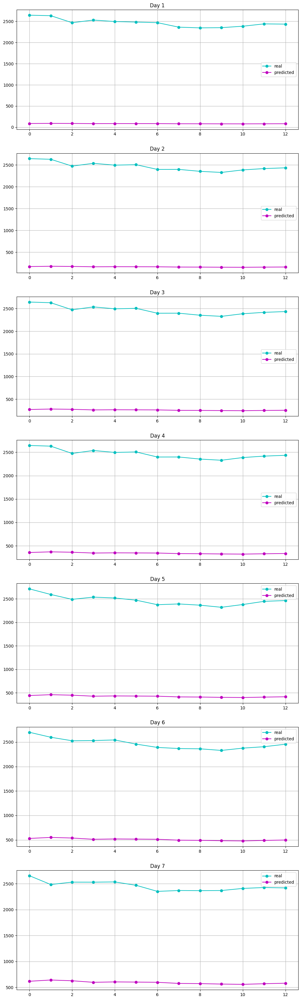

[2131.43505723] 
 [2383.2769221546487, 2297.3135175675297, 2204.2062684626503, 2121.1768394333035, 2042.7782397112833, 1958.7933602557184, 1864.327952311258]


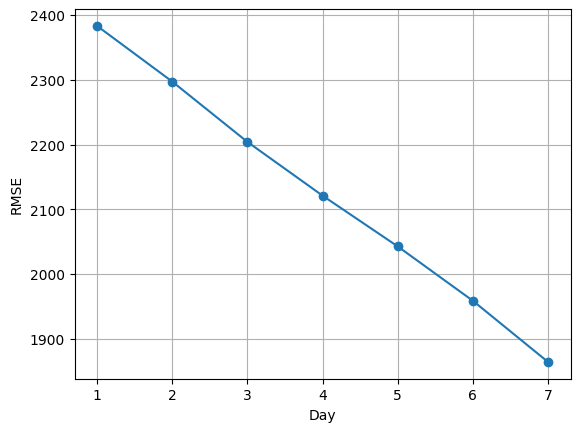

In [ ]:
n_input=7
model=two_layers_model(tf.keras.layers.LSTM,n_input)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es])
score,scores=evaluate_model(model,data_train,data_test,n_input)
print(score,'\n',scores)
plot_error_days(scores)

#### **14 days**

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_6 (Conv1D)               │ (None, 14, 32)         │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_6 (MaxPooling1D)  │ (None, 7, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_7 (Conv1D)               │ (None, 7, 64)          │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_7 (MaxPooling1D)  │ (None, 3, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 192)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_5 (RepeatVector)  │ (None, 7, 192)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_3 (LSTM)                   │ (None, 7, 8)           │         6,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_10             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_11             │ (None, 7, 1)           │             9 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,769 (42.07 KB)

 Trainable params: 10,769 (42.07 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 2960357.2500
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247640.2188
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 192823.5781
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 138251.6719
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 97159.2266
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 96281.9922
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 75956.0391
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 54598.3242
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 42912.4766
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 34852.5781
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 27760.2344
Epoch 12/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 23888.3613
Epoch 13/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 19989.9336
Epoch 14/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 16992.9160
Epoch 15/25
64/64 ━━━━━

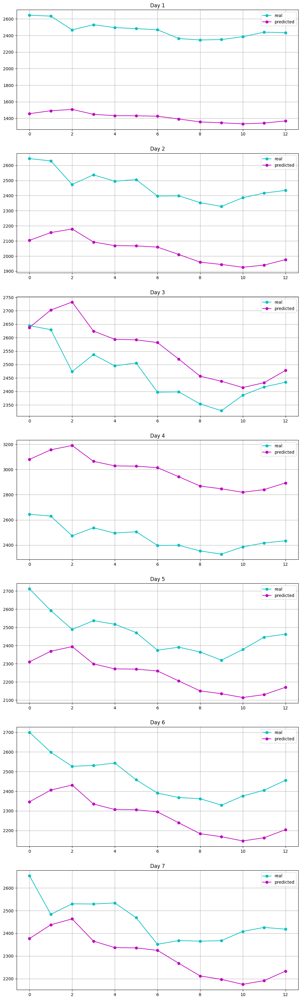

[495.81950058] 
 [1057.225116533754, 428.80531702454726, 114.77303376891936, 526.233674616059, 241.6030772655543, 204.98569108823258, 169.62895716382496]


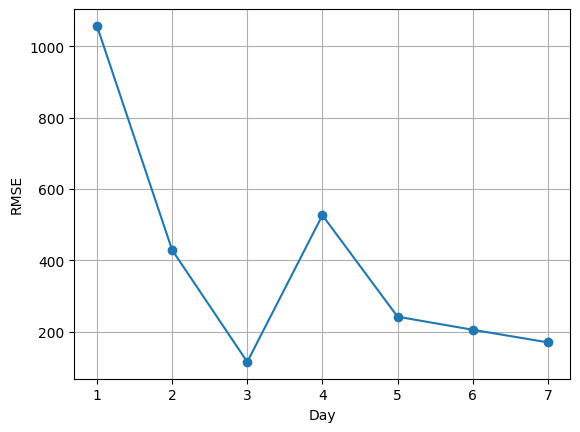

In [ ]:
n_input=14
model=two_layers_model(tf.keras.layers.LSTM,n_input)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es])
score,scores=evaluate_model(model,data_train,data_test,n_input)
print(score,'\n',scores)
plot_error_days(scores)

### **GRU**

#### **7 days**

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_8 (Conv1D)               │ (None, 7, 32)          │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_8 (MaxPooling1D)  │ (None, 3, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_9 (Conv1D)               │ (None, 3, 64)          │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_9 (MaxPooling1D)  │ (None, 1, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_6 (RepeatVector)  │ (None, 7, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_2 (GRU)                     │ (None, 7, 8)           │         1,776 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_12             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_13             │ (None, 7, 1)           │             9 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,113 (23.88 KB)

 Trainable params: 6,113 (23.88 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 5684986.0000
Epoch 2/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253902.3281
Epoch 3/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7893.8735
Epoch 4/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7252.0195
Epoch 5/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7161.4692
Epoch 6/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6576.1577
Epoch 7/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6434.3901
Epoch 8/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5523.6895
Epoch 9/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5550.4468
Epoch 10/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6289.2578
Epoch 11/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5871.5044
Epoch 12/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5097.0186
Epoch 13/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4456.9048
Epoch 14/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5192.3462
Epoch 15/25
65/65 ━━━━━━━━━━━━━━━━━━━━

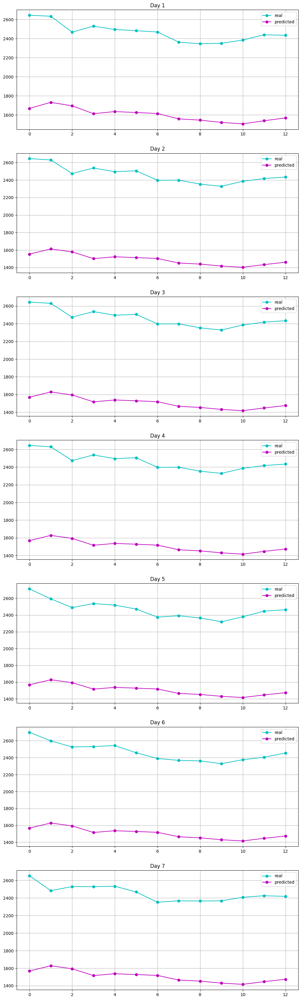

[947.18825227] 
 [864.120263607399, 971.9958681049554, 956.1909328704832, 958.0271494898271, 962.9859949703094, 961.7206386165282, 950.9540296761905]


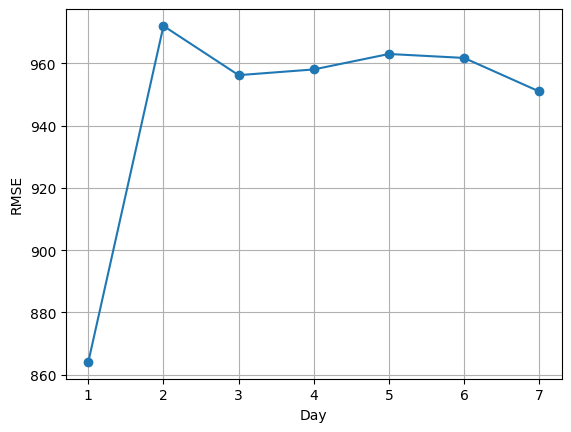

In [ ]:
n_input=7
model=two_layers_model(tf.keras.layers.GRU,n_input)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es])
score,scores=evaluate_model(model,data_train,data_test,n_input)
print(score,'\n',scores)
plot_error_days(scores)

#### **14 days**

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_10 (Conv1D)              │ (None, 14, 32)         │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_10 (MaxPooling1D) │ (None, 7, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_11 (Conv1D)              │ (None, 7, 64)          │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_11 (MaxPooling1D) │ (None, 3, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_7 (Flatten)             │ (None, 192)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_7 (RepeatVector)  │ (None, 7, 192)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_3 (GRU)                     │ (None, 7, 8)           │         4,848 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_14             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_15             │ (None, 7, 1)           │             9 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,185 (35.88 KB)

 Trainable params: 9,185 (35.88 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 5273607.5000
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 22979.1875
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5554.8564
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5565.4580
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5019.8003
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5741.4473
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5737.8867
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4822.4209
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4752.7593
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5432.8125
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5684.2002
Epoch 12/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4523.8745
Epoch 13/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4723.9033
Epoch 14/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4963.4937
Epoch 15/25
64/64 ━━━━━━━━━━━━━━━━━━━━

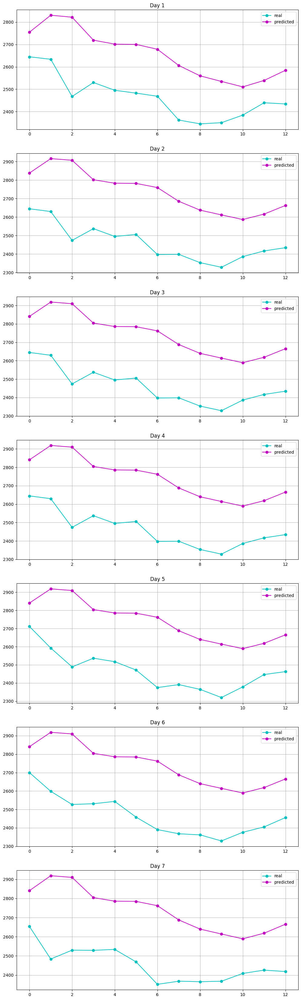

[276.24256371] 
 [202.3516505368475, 282.9925083716675, 285.72691216806726, 285.82564189434595, 285.3204045374322, 283.29851225274007, 296.8783952358896]


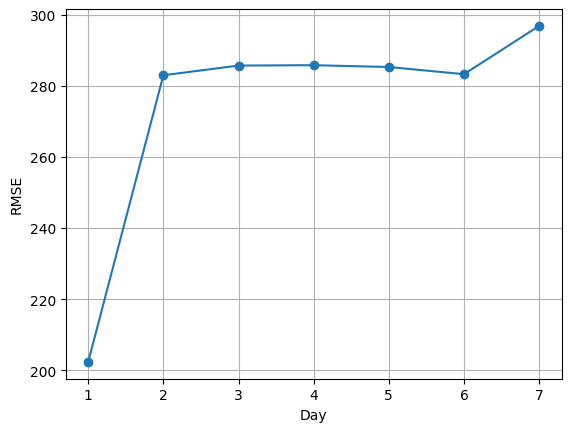

In [ ]:
n_input=14
model=two_layers_model(tf.keras.layers.GRU,n_input)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es])
score,scores=evaluate_model(model,data_train,data_test,n_input)
print(score,'\n',scores)
plot_error_days(scores)

## **Models with one ConvLSTM2D layer**

### **LSTM**

#### **7 days**

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_lstm2d (ConvLSTM2D)        │ (None, 1, 7, 32)       │         8,576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_8 (Flatten)             │ (None, 224)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_8 (RepeatVector)  │ (None, 7, 224)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_4 (LSTM)                   │ (None, 7, 8)           │         7,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_16             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_17             │ (None, 7, 1)           │             9 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,113 (62.94 KB)

 Trainable params: 16,113 (62.94 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 3855270.7500
Epoch 2/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1343578.3750
Epoch 3/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1318234.7500
Epoch 4/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1295654.5000
Epoch 5/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1289234.7500
Epoch 6/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1273248.5000
Epoch 7/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1257469.8750
Epoch 8/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1231660.3750
Epoch 9/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1210576.0000
Epoch 10/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1181347.7500
Epoch 11/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1152377.5000
Epoch 12/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1130455.3750
Epoch 13/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1096470.5000
Epoch 14/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1061248.7500
E

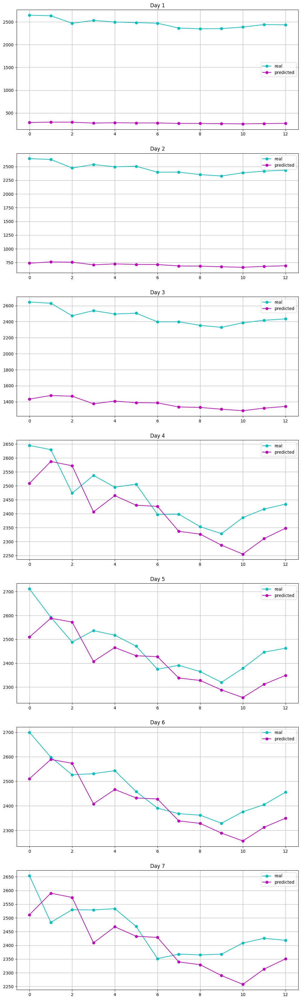

[1139.53028271] 
 [2188.24781248394, 1755.2908437808926, 1089.7156263168038, 86.10252065201661, 97.22981387992238, 87.16028439939615, 91.0279036507155]


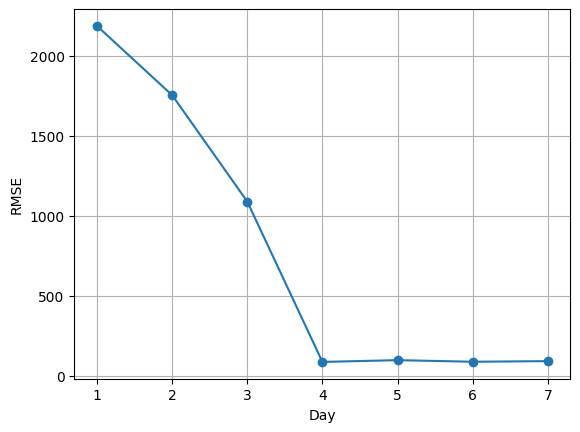

In [ ]:
n_input=7
n_steps=n_input//n_length
model=convlstm_model(tf.keras.layers.LSTM,n_length,n_steps)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
X_train=X_train.reshape((X_train.shape[0],n_steps,1,n_length,n_features))
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es])
score,scores=evaluate_model_convlstm(model,data_train,data_test,n_steps,n_length,n_input)
print(score,'\n',scores)
plot_error_days(scores)

#### **14 days**

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_lstm2d_1 (ConvLSTM2D)      │ (None, 1, 7, 32)       │         8,576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_9 (Flatten)             │ (None, 224)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_9 (RepeatVector)  │ (None, 7, 224)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_5 (LSTM)                   │ (None, 7, 8)           │         7,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_18             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_19             │ (None, 7, 1)           │             9 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,113 (62.94 KB)

 Trainable params: 16,113 (62.94 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 6503996.5000
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 2917741.5000
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1202720.2500
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 973685.8125
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 773194.2500
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 624989.3125
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 433392.8750
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231599.2031
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 105495.0469
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 764185.4375
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 71613.5938
Epoch 12/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 64234.2461
Epoch 13/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 57446.1484
Epoch 14/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 51985.0078
Epoch 15/25
64/

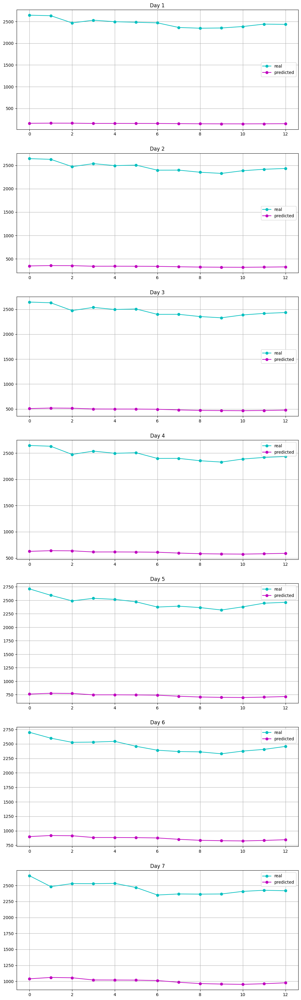

[1886.4354639] 
 [2313.776191008628, 2127.9620592414076, 1973.727191156927, 1858.3043119097206, 1734.0664025036815, 1599.48869715536, 1454.112859186121]


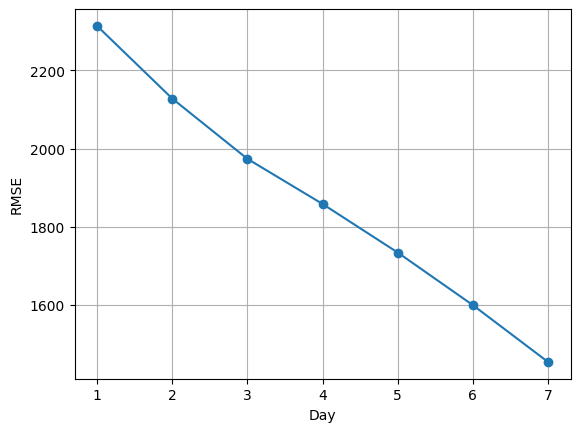

In [ ]:
n_input=14
n_steps=n_input//n_length
model=convlstm_model(tf.keras.layers.LSTM,n_length,n_steps)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
X_train=X_train.reshape((X_train.shape[0],n_steps,1,n_length,n_features))
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es])
score,scores=evaluate_model_convlstm(model,data_train,data_test,n_steps,n_length,n_input)
print(score,'\n',scores)
plot_error_days(scores)

### **GRU**

#### **7 days**

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_lstm2d_2 (ConvLSTM2D)      │ (None, 1, 7, 32)       │         8,576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_10 (Flatten)            │ (None, 224)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_10 (RepeatVector) │ (None, 7, 224)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_4 (GRU)                     │ (None, 7, 8)           │         5,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_20             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_21             │ (None, 7, 1)           │             9 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,273 (55.75 KB)

 Trainable params: 14,273 (55.75 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 6134194.0000
Epoch 2/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1484012.6250
Epoch 3/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 179180.7500
Epoch 4/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 130012.9375
Epoch 5/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 91886.3984
Epoch 6/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 63315.7617
Epoch 7/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 41706.2695
Epoch 8/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 26317.2793
Epoch 9/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 16347.6270
Epoch 10/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 10882.6318
Epoch 11/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 8255.4395
Epoch 12/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5941.3398
Epoch 13/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4856.4048
Epoch 14/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3856.5603
Epoch 15/25
65/65 ━━━━━━━━━

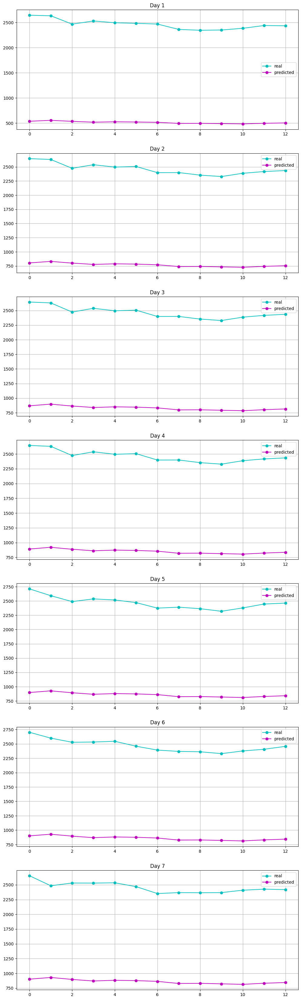

[1675.72225894] 
 [1952.0854627124293, 1694.235459933587, 1632.0853488952878, 1611.4937594697242, 1609.6820169406994, 1606.5504265329598, 1594.5372321531388]


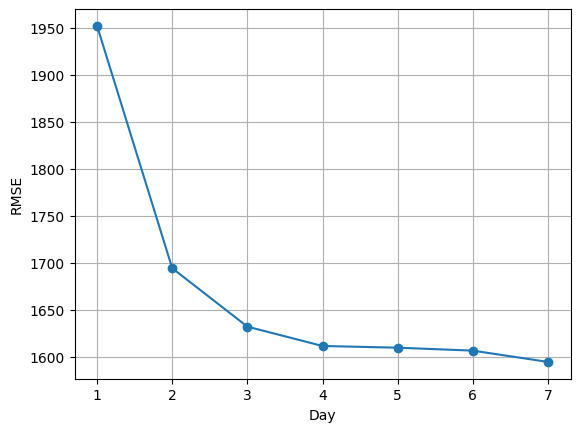

In [ ]:
n_input=7
n_steps=n_input//n_length
model=convlstm_model(tf.keras.layers.GRU,n_length,n_steps)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
X_train=X_train.reshape((X_train.shape[0],n_steps,1,n_length,n_features))
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es])
score,scores=evaluate_model_convlstm(model,data_train,data_test,n_steps,n_length,n_input)
print(score,'\n',scores)
plot_error_days(scores)

#### **14 days**

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_lstm2d_3 (ConvLSTM2D)      │ (None, 1, 7, 32)       │         8,576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_11 (Flatten)            │ (None, 224)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_11 (RepeatVector) │ (None, 7, 224)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_5 (GRU)                     │ (None, 7, 8)           │         5,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_22             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_23             │ (None, 7, 1)           │             9 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,273 (55.75 KB)

 Trainable params: 14,273 (55.75 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 4907874.5000
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 67601.8594
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 28293.6973
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 21197.0176
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 16207.0293
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 11121.7881
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 9216.2607
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7270.5928
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5846.1079
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5170.6470
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5264.0112
Epoch 12/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4756.9277
Epoch 13/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5349.0068
Epoch 14/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4990.5068
Epoch 15/25
64/64 ━━━━━━━━━━━━━━━━

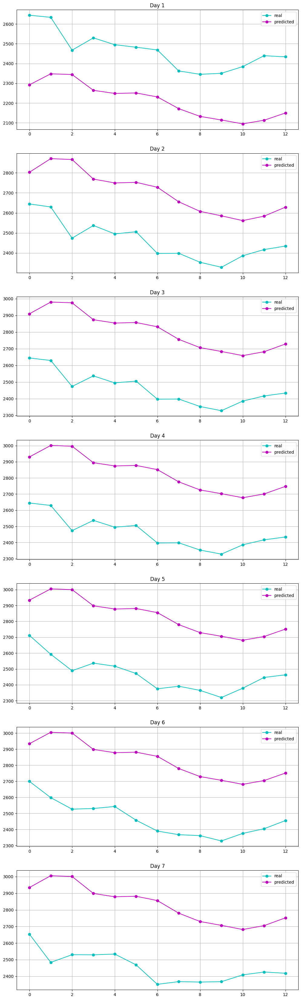

[342.07594316] 
 [258.92653570154414, 251.01606717895498, 351.87255777135624, 371.30340510170413, 373.52548097129477, 372.82642938239957, 385.82158109102977]


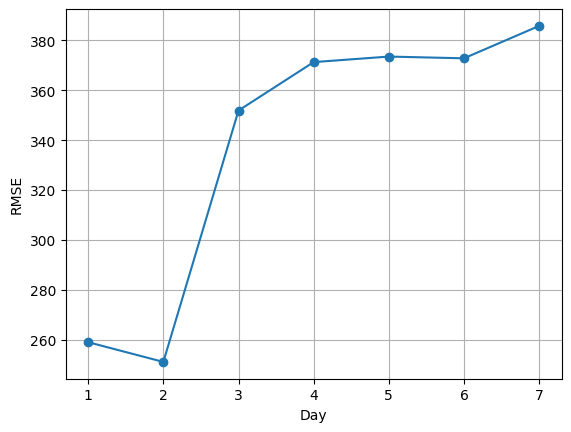

In [ ]:
n_input=14
n_steps=n_input//n_length
model=convlstm_model(tf.keras.layers.GRU,n_length,n_steps)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
X_train=X_train.reshape((X_train.shape[0],n_steps,1,n_length,n_features))
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es])
score,scores=evaluate_model_convlstm(model,data_train,data_test,n_steps,n_length,n_input)
print(score,'\n',scores)
plot_error_days(scores)

## **Models with two ConvLSTM2D layers**

### **LSTM**

#### **7 days**

Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_lstm2d_4 (ConvLSTM2D)      │ (None, 1, 1, 7, 32)    │         8,576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_lstm2d_5 (ConvLSTM2D)      │ (None, 1, 7, 32)       │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_12 (Flatten)            │ (None, 224)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_12 (RepeatVector) │ (None, 7, 224)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_6 (LSTM)                   │ (None, 7, 8)           │         7,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_24             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_25             │ (None, 7, 1)           │             9 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 32,625 (127.44 KB)

 Trainable params: 32,625 (127.44 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - loss: 5952952.0000
Epoch 2/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1752477.6250
Epoch 3/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 999406.8750 
Epoch 4/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 368042.7500
Epoch 5/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 120322.5938
Epoch 6/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 60829.1992
Epoch 7/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 34737.9609
Epoch 8/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 18709.3203
Epoch 9/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 9501.1396
Epoch 10/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6304.8389
Epoch 11/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4738.5923
Epoch 12/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3341.7634
Epoch 13/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4099.2671
Epoch 14/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4357.8999
Epoch 15/25
65/65 ━━━━━━━━━

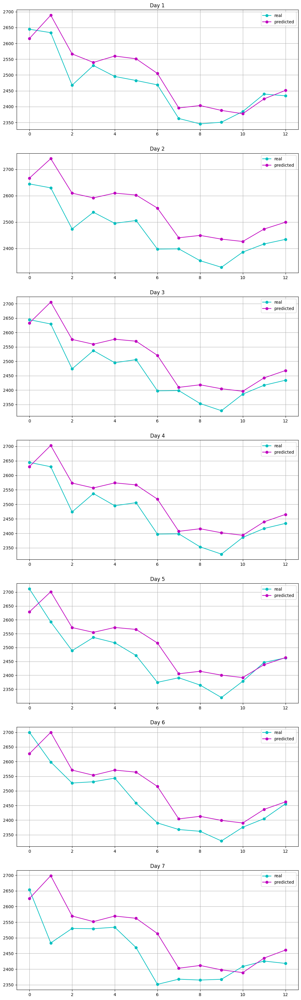

[71.38603795] 
 [48.33195566591451, 92.8842897949999, 64.99358414385964, 62.85111909605153, 72.05023747745956, 65.37064819695676, 84.07917790547664]


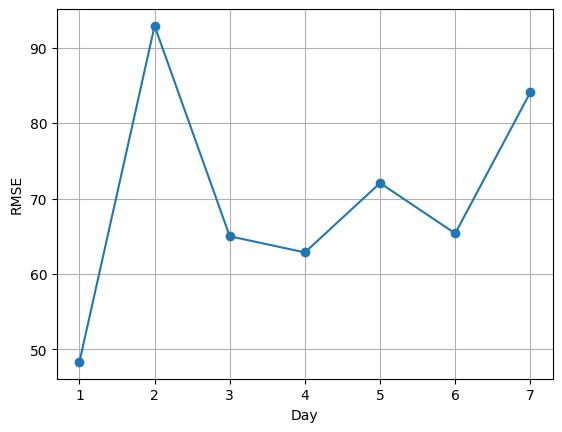

In [ ]:
n_input=7
n_steps=n_input//n_length
model=convlstm_two_layers_model(tf.keras.layers.LSTM,n_length,n_steps)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
X_train=X_train.reshape((X_train.shape[0],n_steps,1,n_length,n_features))
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es])
score,scores=evaluate_model_convlstm(model,data_train,data_test,n_steps,n_length,n_input)
print(score,'\n',scores)
plot_error_days(scores)

#### **14 days**

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_lstm2d_6 (ConvLSTM2D)      │ (None, 2, 1, 7, 32)    │         8,576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_lstm2d_7 (ConvLSTM2D)      │ (None, 1, 7, 32)       │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_13 (Flatten)            │ (None, 224)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_13 (RepeatVector) │ (None, 7, 224)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_7 (LSTM)                   │ (None, 7, 8)           │         7,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_26             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_27             │ (None, 7, 1)           │             9 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 32,625 (127.44 KB)

 Trainable params: 32,625 (127.44 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 6013031.5000
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1287944.5000
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 730623.0000
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 387443.8125
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 471642.4062
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 404823.8125
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 335150.5000
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 296527.4062
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 153191.6094
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 101351.3828
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 60619.3672
Epoch 12/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 35956.1250
Epoch 13/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 18325.2480
Epoch 14/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 12819.0791
Epoch 15/25
64/

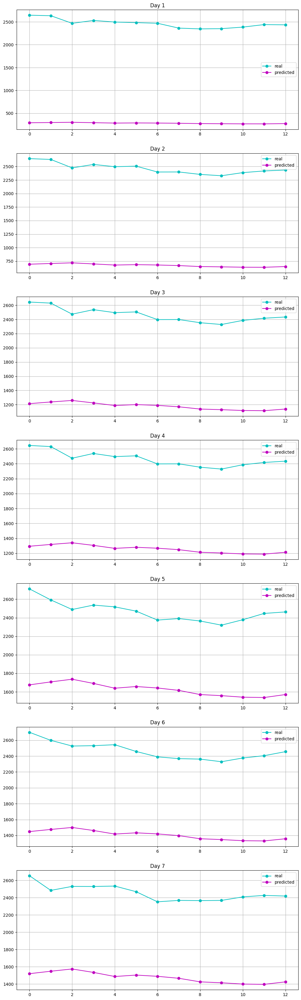

[1407.9881253] 
 [2182.1930960035265, 1790.1037824587079, 1285.1116225789601, 1207.0992077827962, 843.3733911589165, 1061.5643489304882, 981.7218256115391]


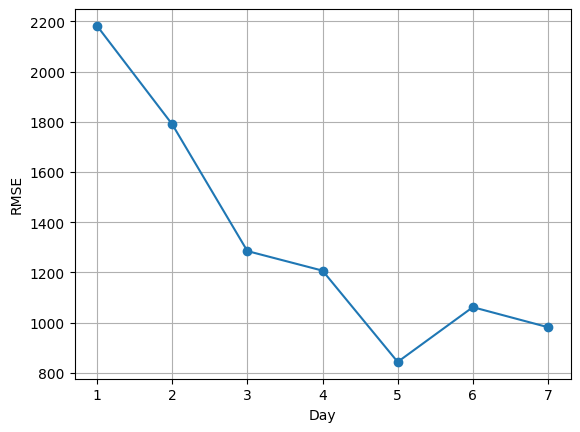

In [ ]:
n_input=14
n_steps=n_input//n_length
model=convlstm_two_layers_model(tf.keras.layers.LSTM,n_length,n_steps)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
X_train=X_train.reshape((X_train.shape[0],n_steps,1,n_length,n_features))
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es])
score,scores=evaluate_model_convlstm(model,data_train,data_test,n_steps,n_length,n_input)
print(score,'\n',scores)
plot_error_days(scores)

### **GRU**

#### **7 days**

Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_lstm2d_8 (ConvLSTM2D)      │ (None, 1, 1, 7, 32)    │         8,576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_lstm2d_9 (ConvLSTM2D)      │ (None, 1, 7, 32)       │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_14 (Flatten)            │ (None, 224)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_14 (RepeatVector) │ (None, 7, 224)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_6 (GRU)                     │ (None, 7, 8)           │         5,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_28             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_29             │ (None, 7, 1)           │             9 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 30,785 (120.25 KB)

 Trainable params: 30,785 (120.25 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - loss: 6448595.5000
Epoch 2/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 2911402.7500
Epoch 3/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4700.7388
Epoch 4/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3715.0481
Epoch 5/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3171.0974
Epoch 6/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3695.0452
Epoch 7/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3567.9680
Epoch 8/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3858.8245
Epoch 9/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4184.3931
Epoch 10/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3660.2473
Epoch 11/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3187.8970
Epoch 12/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3324.4924
Epoch 13/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3503.2319
Epoch 14/25
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3273.5186
Epoch 15/25
65/65 ━━━━━━━━━━━━━━━━━━━

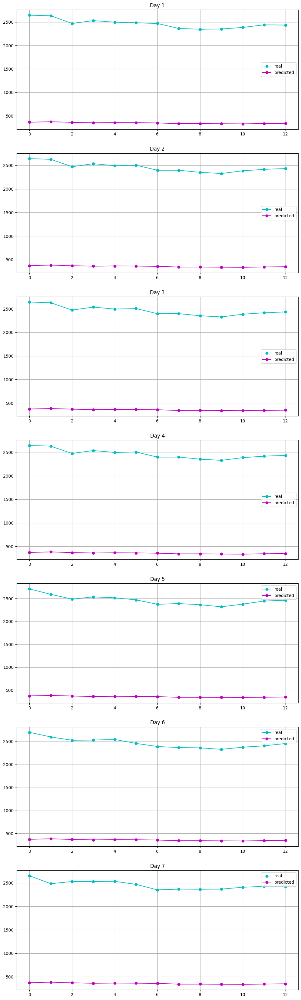

[2108.8075874] 
 [2118.2206618570654, 2107.2550206087794, 2107.0782551749808, 2107.071397075273, 2111.7166422740297, 2110.845435585462, 2099.418803959726]


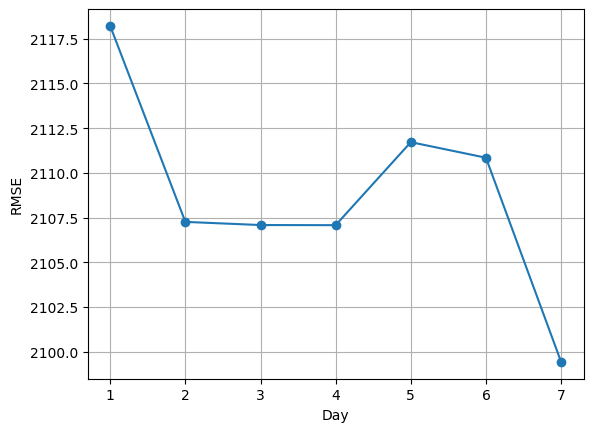

In [ ]:
n_input=7
n_steps=n_input//n_length
model=convlstm_two_layers_model(tf.keras.layers.GRU,n_length,n_steps)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
X_train=X_train.reshape((X_train.shape[0],n_steps,1,n_length,n_features))
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es])
score,scores=evaluate_model_convlstm(model,data_train,data_test,n_steps,n_length,n_input)
print(score,'\n',scores)
plot_error_days(scores)

#### **14 days**

Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_lstm2d_10 (ConvLSTM2D)     │ (None, 2, 1, 7, 32)    │         8,576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_lstm2d_11 (ConvLSTM2D)     │ (None, 1, 7, 32)       │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_15 (Flatten)            │ (None, 224)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_15 (RepeatVector) │ (None, 7, 224)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_7 (GRU)                     │ (None, 7, 8)           │         5,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_30             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_31             │ (None, 7, 1)           │             9 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 30,785 (120.25 KB)

 Trainable params: 30,785 (120.25 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 5911399.0000
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 124601.7734
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 32711.9824
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9099.5137
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5428.9458
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5940.7686
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5790.8521
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5363.9717
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6467.6577
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6438.1870
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6390.5845
Epoch 12/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6837.4541
Epoch 13/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5551.5317
Epoch 14/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5254.0757
Epoch 15/25
64/64 ━━━━━━━━━━━━━━━━━

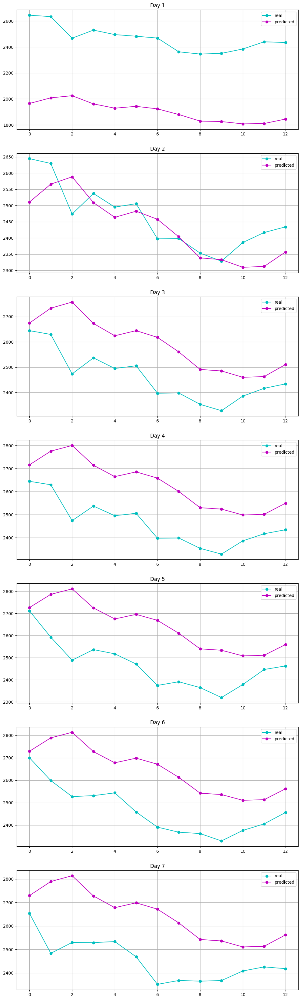

[266.27813566] 
 [564.0041095808011, 70.21973400652098, 146.45628319306616, 183.33205617232613, 194.90461363649436, 193.82088143129178, 206.59729871889553]


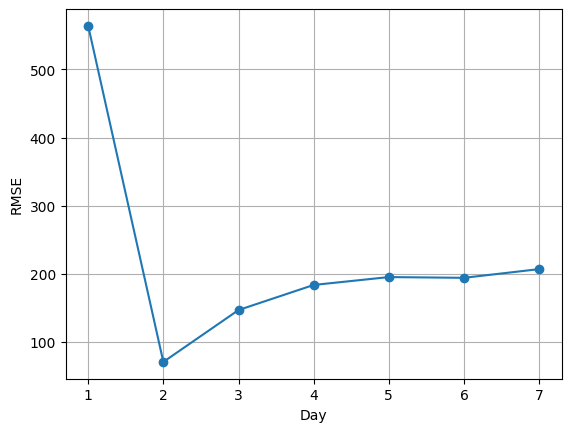

In [ ]:
n_input=14
n_steps=n_input//n_length
model=convlstm_two_layers_model(tf.keras.layers.GRU,n_length,n_steps)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
X_train=X_train.reshape((X_train.shape[0],n_steps,1,n_length,n_features))
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es])
score,scores=evaluate_model_convlstm(model,data_train,data_test,n_steps,n_length,n_input)
print(score,'\n',scores)
plot_error_days(scores)

# **Multivariate data**

## **Preparing data**

In [ ]:
df1=pd.read_csv('/kaggle/input/national-stock-exchange-time-series/tcs_stock.csv')
df2=pd.read_csv('/kaggle/input/national-stock-exchange-time-series/nifty_it_index.csv')
df=pd.DataFrame(columns=['Date'],data=df1['Date'])
df['TCS']=df1['Close']
df['Nifty']=df2['Close']
df['Date']=pd.to_datetime(df['Date'])
display(df)

,Date,TCS,Nifty
0,2015-01-01,2545.55,11215.70
1,2015-01-02,2579.45,11372.10
2,2015-01-05,2540.25,11248.55
3,2015-01-06,2446.60,10959.90
4,2015-01-07,2417.70,10916.00
...,...,...,...
243,2015-12-24,2434.25,11184.90
244,2015-12-28,2462.70,11271.80
245,2015-12-29,2455.80,11253.45
246,2015-12-30,2418.30,11117.60


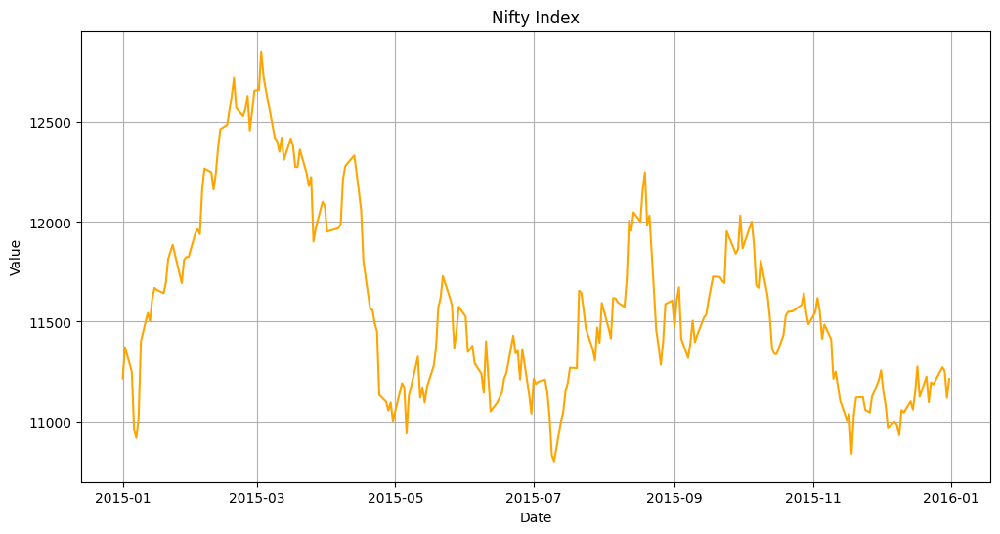

In [ ]:
fig=plt.figure(figsize=(12,6))
ax=fig.add_subplot(1,1,1)
ax.set_title('Nifty Index')
ax.set_xlabel('Date')
ax.set_ylabel('Value')
ax.grid()
ax.plot(df['Date'],df['Nifty'],color='orange')
plt.show()

In [ ]:
dates=[]
start=datetime.date(2015,1,1)
end=datetime.date(2015,12,31)
for i in range((end-start).days+1):
    dates.append(start+datetime.timedelta(days=i))
df_=pd.DataFrame(columns=['Date'],data=dates)
df_['Date']=pd.to_datetime(df_['Date'])
df=df.merge(df_,how='right',on='Date')
display(df)

,Date,TCS,Nifty
0,2015-01-01,2545.55,11215.70
1,2015-01-02,2579.45,11372.10
2,2015-01-03,NaN,NaN
3,2015-01-04,NaN,NaN
4,2015-01-05,2540.25,11248.55
...,...,...,...
360,2015-12-27,NaN,NaN
361,2015-12-28,2462.70,11271.80
362,2015-12-29,2455.80,11253.45
363,2015-12-30,2418.30,11117.60


In [ ]:
for i in range(df.shape[0]):
    if df.loc[i,'TCS']!=df.loc[i,'TCS']:
        df.loc[i,'TCS']=df.loc[i-1,'TCS']
for i in range(df.shape[0]):
    if df.loc[i,'Nifty']!=df.loc[i,'Nifty']:
        df.loc[i,'Nifty']=df.loc[i-1,'Nifty']
display(df)

,Date,TCS,Nifty
0,2015-01-01,2545.55,11215.70
1,2015-01-02,2579.45,11372.10
2,2015-01-03,2579.45,11372.10
3,2015-01-04,2579.45,11372.10
4,2015-01-05,2540.25,11248.55
...,...,...,...
360,2015-12-27,2434.25,11184.90
361,2015-12-28,2462.70,11271.80
362,2015-12-29,2455.80,11253.45
363,2015-12-30,2418.30,11117.60


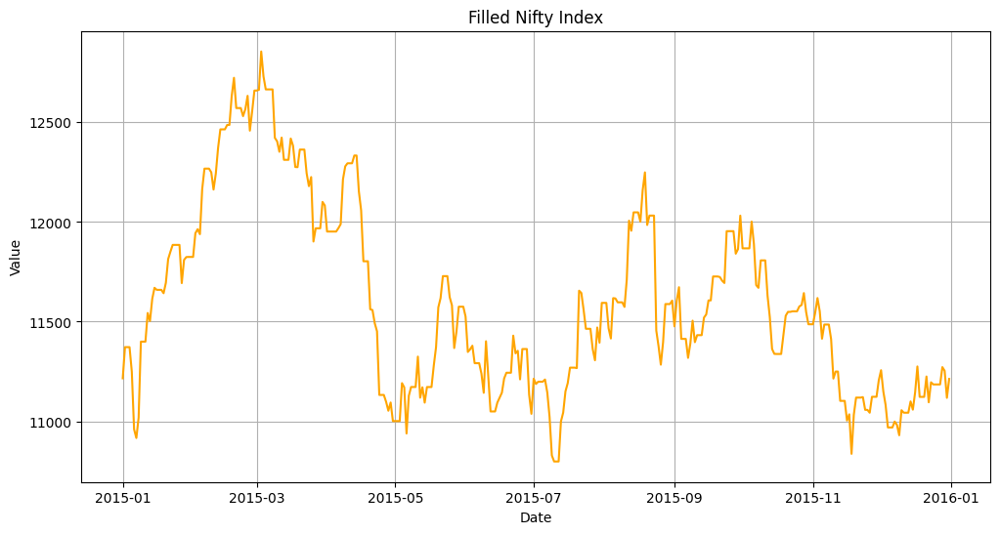

In [ ]:
fig=plt.figure(figsize=(12,6))
ax=fig.add_subplot(1,1,1)
ax.set_title('Filled Nifty Index')
ax.set_xlabel('Date')
ax.set_ylabel('Value')
ax.grid()
ax.plot(df['Date'],df['Nifty'],color='orange')
plt.show()

## **Defining global variables**

In [ ]:
n_features=2
n=df.shape[0]
train_ratio=0.75
n_train=int(train_ratio*n)
BATCH_SIZE=4
target_size=7
n_units=8
n_filters=32
n_length=7
EPOCHS=50
es=tf.keras.callbacks.EarlyStopping(monitor='loss',mode='min',patience=EPOCHS,restore_best_weights=True)

## **Redefining some necessary functions**

In [ ]:
def evaluate_forecasts(actual,predicted):
    scores_all=[]
    score_all=[]
    for j in range(actual.shape[2]):
        scores=[]
        for i in range(actual.shape[1]):
            rmse=((actual[:,i,j]-predicted[:,i,j])**2).mean()**0.5
            scores.append(rmse)
        s=0
        for row in range(actual.shape[0]):
            for col in range(actual.shape[1]):
                s+=(actual[row,col,j]-predicted[row,col,j])**2
        score=(s/(actual.shape[0]*actual.shape[1]))**0.5
        score_all.append(score)
        scores_all.append(scores)
    return score_all,scores_all

In [ ]:
def plot_error_days(scores):
    fig=plt.figure()
    ax=fig.add_subplot()
    ax.set_ylabel('RMSE')
    ax.set_xlabel('Day')
    ax.grid()
    ax.plot([i for i in range(1,target_size+1)],scores[0],marker='o')
    plt.show()

In [ ]:
def evaluate_model(model,train,test,n_input):
    history=[x for x in split_into_windows(train,'train')]
    test=split_into_windows(test,'test')
    predictions=[]
    for i in range(len(test)):
        yhat_sequence=forecast(model,history,n_input)
        predictions.append(yhat_sequence)
        history.append(test[i,:])
    predictions=np.array(predictions)
    score,scores=evaluate_forecasts(test,predictions)
    fig=plt.figure(figsize=(12,6*target_size))
    for i in range(target_size):
        ax=fig.add_subplot(target_size,1,i+1)
        ax.set_title(f'Day {i+1}')
        ax.plot(test[:,i,0],color='c',label='real',marker='o')
        ax.plot(predictions[:,i,0],color='m',label='predicted',marker='o')
        ax.grid()
        ax.legend()
    plt.show()
    return score,scores

In [ ]:
def evaluate_model_convlstm(model,train,test,n_steps,n_length,n_input,n_output=target_size,evaluate_forecasts=evaluate_forecasts):
    history=[x for x in split_into_windows(train,'train')]
    test=split_into_windows(test,'test')
    predictions=[]
    for i in range(len(test)):
        yhat_sequence=forecast_convlstm(model,history,n_steps,n_length,n_input)
        predictions.append(yhat_sequence)
        history.append(test[i,:])
    predictions=np.array(predictions)
    score,scores=evaluate_forecasts(test,predictions)
    fig=plt.figure(figsize=(12,6*target_size))
    for i in range(target_size):
        ax=fig.add_subplot(target_size,1,i+1)
        ax.set_title(f'Day {i+1}')
        ax.plot(test[:,i,0],color='c',label='real',marker='o')
        ax.plot(predictions[:,i,0],color='m',label='predicted',marker='o')
        ax.grid()
        ax.legend()
    plt.show()
    return score, scores

## **Saving data into array and splitting it**

In [ ]:
data=np.zeros(shape=(n,n_features))
data[:,0]=df['TCS'].values
data[:,1]=df['Nifty'].values

In [ ]:
data_train,data_test=data[:n_train],data[n_train:]

## **Models with one convolutional layer**

### **LSTM**

#### **7 days**

Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_12 (Conv1D)              │ (None, 7, 32)          │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_12 (MaxPooling1D) │ (None, 3, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_16 (Flatten)            │ (None, 96)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_16 (RepeatVector) │ (None, 7, 96)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_8 (LSTM)                   │ (None, 7, 8)           │         3,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_32             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_33             │ (None, 7, 2)           │            18 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,610 (14.10 KB)

 Trainable params: 3,610 (14.10 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 55409888.0000
Epoch 2/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7573389.5000
Epoch 3/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 128028.1250
Epoch 4/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 62353.0625
Epoch 5/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 55941.8125
Epoch 6/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 61246.5469
Epoch 7/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 47129.0039
Epoch 8/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 51863.6289
Epoch 9/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 44281.2773
Epoch 10/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 42828.4961
Epoch 11/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 44178.5117
Epoch 12/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 48593.1641
Epoch 13/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 43592.3398
Epoch 14/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 44845.4961
Epoch 15/50
65/65 ━━━━━

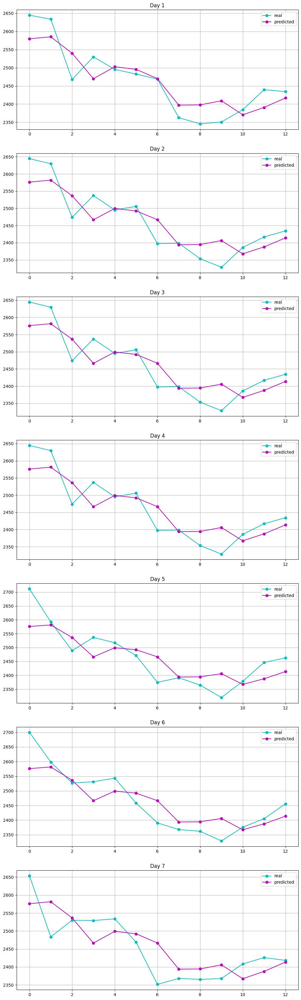

51.92397100629565 
 [44.61333232707885, 48.243386232331254, 48.25587425578386, 48.25573561378669, 61.548742943369156, 54.5174691737286, 56.01133810323645]


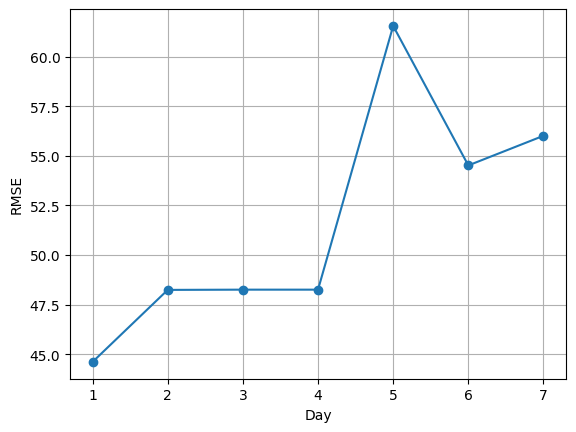

In [ ]:
n_input=7
model=single_layer_model(tf.keras.layers.LSTM,n_input)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es],verbose=1)
score,scores=evaluate_model(model,data_train,data_test,n_input)
print(score[0],'\n',scores[0])
plot_error_days(scores)

#### **14 days**

Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_13 (Conv1D)              │ (None, 14, 32)         │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_13 (MaxPooling1D) │ (None, 7, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_17 (Flatten)            │ (None, 224)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_17 (RepeatVector) │ (None, 7, 224)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_9 (LSTM)                   │ (None, 7, 8)           │         7,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_34             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_35             │ (None, 7, 2)           │            18 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,706 (30.10 KB)

 Trainable params: 7,706 (30.10 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 29695696.0000
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223452.9219
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 100935.2734
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 65188.1680
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 56111.4961
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 47699.2500
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 51471.9883
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 55815.1484
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 51416.8164
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 49592.2383
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 51978.2500
Epoch 12/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 50420.7031
Epoch 13/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 50492.4570
Epoch 14/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 46370.3086
Epoch 15/50
64/64 ━━━━━

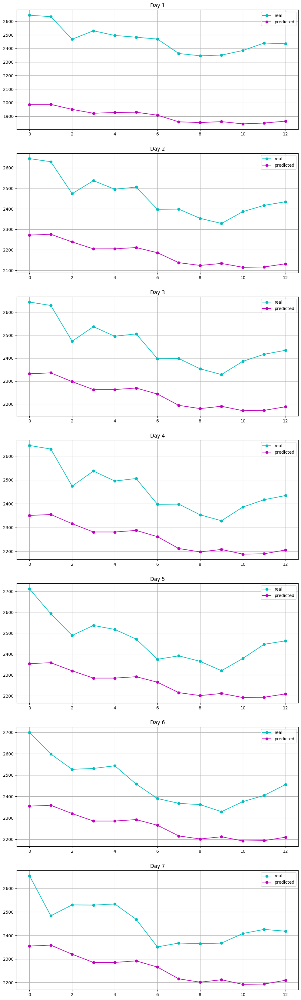

299.7370494016312 
 [563.5314625478375, 285.61147117126137, 228.9633869730654, 211.25845538515676, 216.1331661955963, 213.27664122387176, 201.24520112212718]


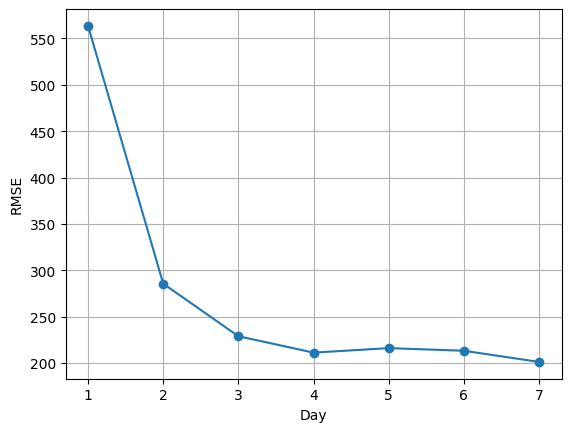

In [ ]:
n_input=14
model=single_layer_model(tf.keras.layers.LSTM,n_input)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es],verbose=1)
score,scores=evaluate_model(model,data_train,data_test,n_input)
print(score[0],'\n',scores[0])
plot_error_days(scores)

### **GRU**

#### **7 days**

Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_14 (Conv1D)              │ (None, 7, 32)          │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_14 (MaxPooling1D) │ (None, 3, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_18 (Flatten)            │ (None, 96)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_18 (RepeatVector) │ (None, 7, 96)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_8 (GRU)                     │ (None, 7, 8)           │         2,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_36             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_37             │ (None, 7, 2)           │            18 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,794 (10.91 KB)

 Trainable params: 2,794 (10.91 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 37826956.0000
Epoch 2/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 183658.0781
Epoch 3/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 133900.1094
Epoch 4/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 99788.3359
Epoch 5/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 82867.3359
Epoch 6/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 83462.8750
Epoch 7/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 61451.2383
Epoch 8/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 57257.9766
Epoch 9/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 51892.9141
Epoch 10/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 52852.4375
Epoch 11/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 43358.0430
Epoch 12/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 45636.1797
Epoch 13/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 42421.7578
Epoch 14/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 42496.4961
Epoch 15/50
65/65 ━━━━━━

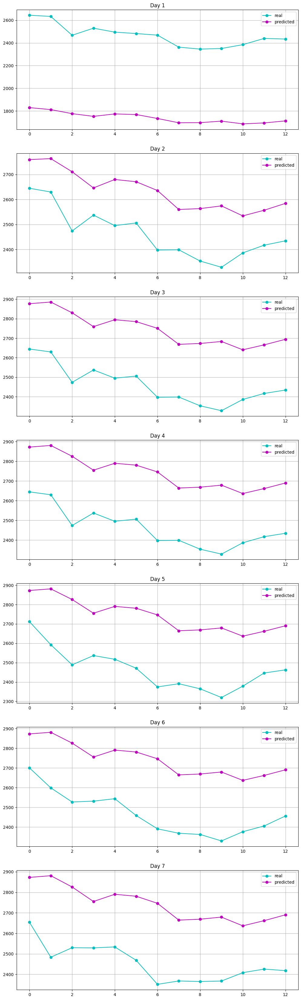

371.9131642665914 
 [725.6120637108472, 177.9092348355579, 288.78791604548417, 284.0218922899003, 283.0174728835684, 282.08086875597974, 293.82962276066195]


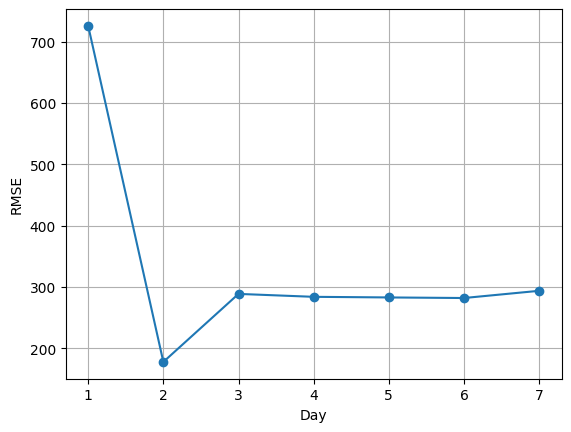

In [ ]:
n_input=7
model=single_layer_model(tf.keras.layers.GRU,n_input)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es],verbose=1)
score,scores=evaluate_model(model,data_train,data_test,n_input)
print(score[0],'\n',scores[0])
plot_error_days(scores)

#### **14 days**

Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_15 (Conv1D)              │ (None, 14, 32)         │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_15 (MaxPooling1D) │ (None, 7, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_19 (Flatten)            │ (None, 224)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_19 (RepeatVector) │ (None, 7, 224)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_9 (GRU)                     │ (None, 7, 8)           │         5,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_38             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_39             │ (None, 7, 2)           │            18 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,866 (22.91 KB)

 Trainable params: 5,866 (22.91 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 67313392.0000
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1649250.0000
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 118449.7578
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 77388.3828
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 71543.4297
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 66652.7109
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 60445.7227
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 56495.2617
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 46559.0898
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 54599.2188
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 55490.8438
Epoch 12/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 58694.9961
Epoch 13/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 53770.3789
Epoch 14/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 47056.1953
Epoch 15/50
64/64 ━━━━

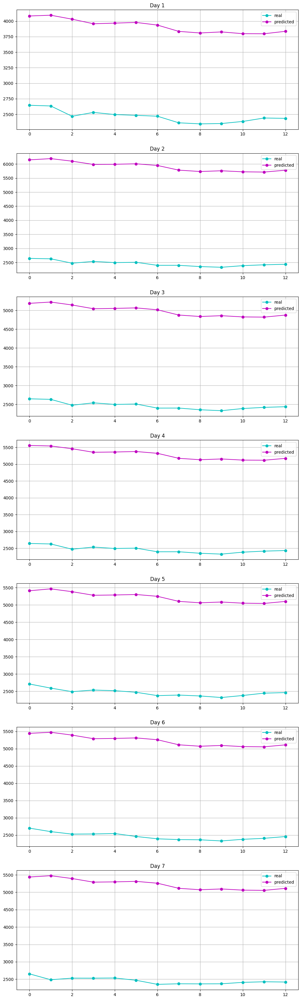

2709.400101502398 
 [1454.780350980392, 3452.5583798929156, 2523.664100265252, 2833.6441977813574, 2753.755230376245, 2766.669867423373, 2777.291338563605]


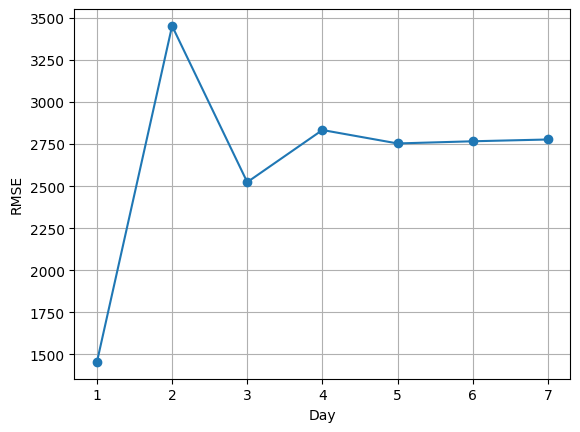

In [ ]:
n_input=14
model=single_layer_model(tf.keras.layers.GRU,n_input)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es],verbose=1)
score,scores=evaluate_model(model,data_train,data_test,n_input)
print(score[0],'\n',scores[0])
plot_error_days(scores)

## **Models with two convolutional layers**

### **LSTM**

#### **7 days**

Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_16 (Conv1D)              │ (None, 7, 32)          │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_16 (MaxPooling1D) │ (None, 3, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_17 (Conv1D)              │ (None, 3, 64)          │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_17 (MaxPooling1D) │ (None, 1, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_20 (Flatten)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_20 (RepeatVector) │ (None, 7, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_10 (LSTM)                  │ (None, 7, 8)           │         2,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_40             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_41             │ (None, 7, 2)           │            18 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,746 (26.35 KB)

 Trainable params: 6,746 (26.35 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 72363152.0000
Epoch 2/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 69230560.0000
Epoch 3/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 59623488.0000
Epoch 4/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 31294312.0000
Epoch 5/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 11744358.0000
Epoch 6/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 9597225.0000
Epoch 7/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 8472353.0000
Epoch 8/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7112485.5000
Epoch 9/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5847788.0000
Epoch 10/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4550065.5000
Epoch 11/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3285812.7500
Epoch 12/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 2220385.0000
Epoch 13/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1307808.5000
Epoch 14/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 655728.06

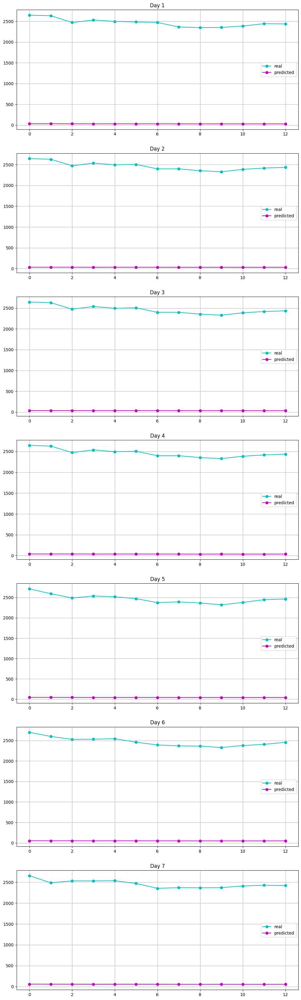

2423.8838524541816 
 [2437.853509616897, 2432.155572680597, 2429.4659379902055, 2426.1329326744917, 2424.458459540389, 2417.3454038428013, 2399.582603884463]


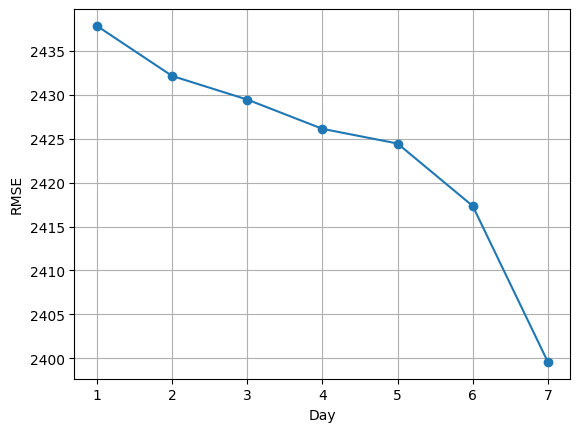

In [ ]:
n_input=7
model=two_layers_model(tf.keras.layers.LSTM,n_input)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es],verbose=1)
score,scores=evaluate_model(model,data_train,data_test,n_input)
print(score[0],'\n',scores[0])
plot_error_days(scores)

#### **14 days**

Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_18 (Conv1D)              │ (None, 14, 32)         │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_18 (MaxPooling1D) │ (None, 7, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_19 (Conv1D)              │ (None, 7, 64)          │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_19 (MaxPooling1D) │ (None, 3, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_21 (Flatten)            │ (None, 192)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_21 (RepeatVector) │ (None, 7, 192)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_11 (LSTM)                  │ (None, 7, 8)           │         6,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_42             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_43             │ (None, 7, 2)           │            18 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,842 (42.35 KB)

 Trainable params: 10,842 (42.35 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 54862880.0000
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 10157570.0000
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 491769.4375
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 147085.0938
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 115053.4297
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 96015.3906
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 73331.7266
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 83925.9688
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 77779.0391
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 68341.0078
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 62302.7930
Epoch 12/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 72162.9062
Epoch 13/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 54889.2305
Epoch 14/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 69866.4922
Epoch 15/50
64/64 ━

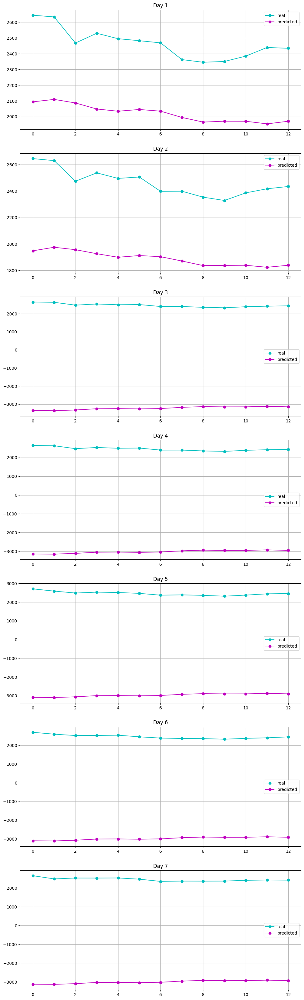

4662.93970311076 
 [446.6168918803412, 574.8998825647407, 5688.234955070767, 5488.919022638843, 5441.821546589402, 5454.297882839721, 5461.138536971096]


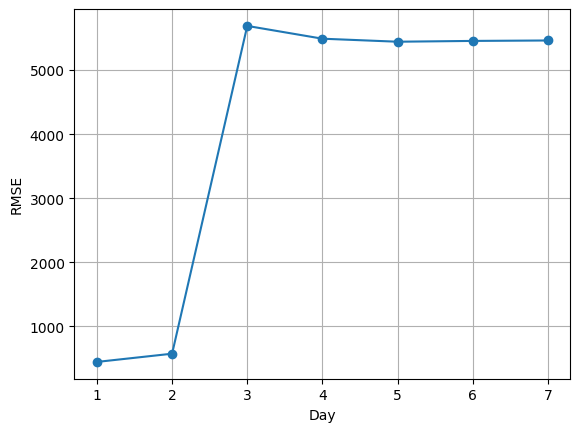

In [ ]:
n_input=14
model=two_layers_model(tf.keras.layers.LSTM,n_input)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es],verbose=1)
score,scores=evaluate_model(model,data_train,data_test,n_input)
print(score[0],'\n',scores[0])
plot_error_days(scores)

### **GRU**

#### **7 days**

Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_20 (Conv1D)              │ (None, 7, 32)          │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_20 (MaxPooling1D) │ (None, 3, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_21 (Conv1D)              │ (None, 3, 64)          │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_21 (MaxPooling1D) │ (None, 1, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_22 (Flatten)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_22 (RepeatVector) │ (None, 7, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_10 (GRU)                    │ (None, 7, 8)           │         1,776 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_44             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_45             │ (None, 7, 2)           │            18 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,186 (24.16 KB)

 Trainable params: 6,186 (24.16 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 32600636.0000
Epoch 2/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 71790.3438
Epoch 3/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 49948.3789
Epoch 4/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 43880.1562
Epoch 5/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 42271.7227
Epoch 6/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 46335.1211
Epoch 7/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 47497.2344
Epoch 8/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 50082.6602
Epoch 9/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 46065.8086
Epoch 10/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 43812.9883
Epoch 11/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 47591.2227
Epoch 12/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 44048.2891
Epoch 13/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 43856.6562
Epoch 14/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 48834.0156
Epoch 15/50
65/65 ━━━━━━━━

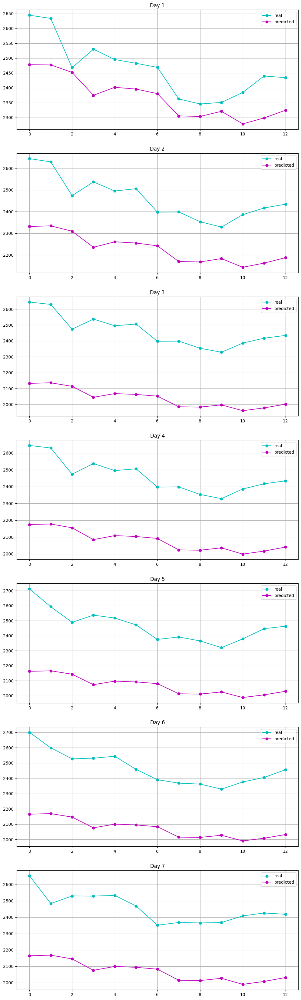

352.7655674315448 
 [107.40956474165257, 238.34555053333634, 425.9262051971101, 385.8610139042225, 403.66636858980075, 398.50780607607544, 388.2042502874217]


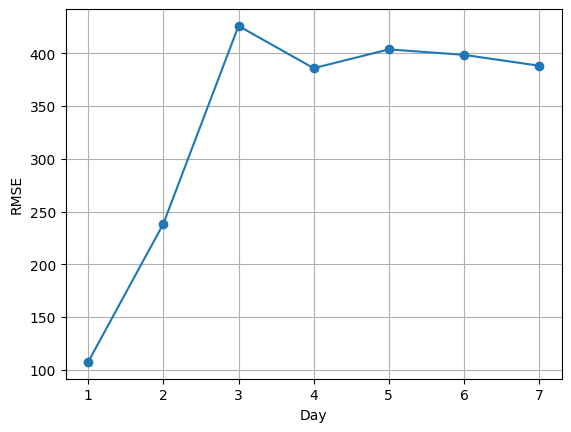

In [ ]:
n_input=7
model=two_layers_model(tf.keras.layers.GRU,n_input)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es],verbose=1)
score,scores=evaluate_model(model,data_train,data_test,n_input)
print(score[0],'\n',scores[0])
plot_error_days(scores)

#### **14 days**

Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_22 (Conv1D)              │ (None, 14, 32)         │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_22 (MaxPooling1D) │ (None, 7, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_23 (Conv1D)              │ (None, 7, 64)          │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_23 (MaxPooling1D) │ (None, 3, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_23 (Flatten)            │ (None, 192)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_23 (RepeatVector) │ (None, 7, 192)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_11 (GRU)                    │ (None, 7, 8)           │         4,848 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_46             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_47             │ (None, 7, 2)           │            18 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,258 (36.16 KB)

 Trainable params: 9,258 (36.16 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 32957418.0000
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1851350.2500
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 802736.3125
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 547859.3125
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 353915.8438
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212924.1406
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 144077.3594
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 132389.7500
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 120094.1094
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 86604.3672
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 90905.1172
Epoch 12/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 81563.7031
Epoch 13/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 94300.8672
Epoch 14/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 77535.9609
Epoch 15/50
64/6

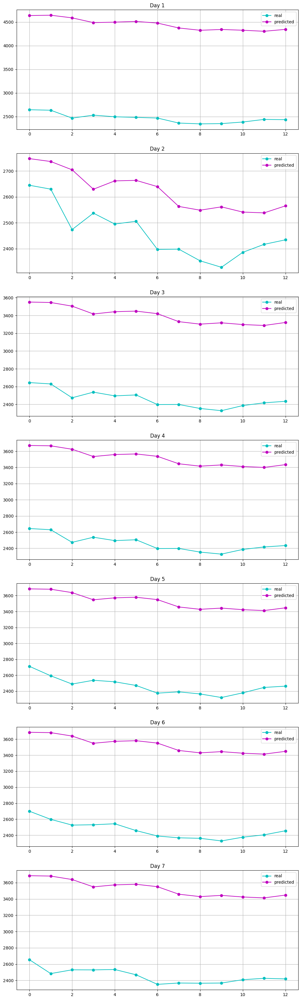

1158.5782612748706 
 [1986.8522213834203, 168.70681906739773, 938.6852806873059, 1054.8104264926612, 1063.7931577224308, 1065.3839393665828, 1076.8599998982631]


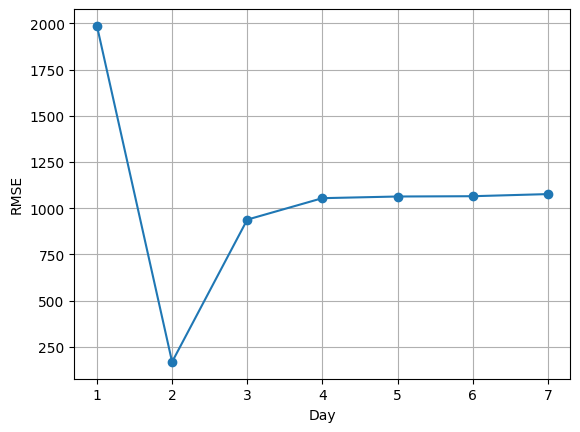

In [ ]:
n_input=14
model=two_layers_model(tf.keras.layers.GRU,n_input)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es],verbose=1)
score,scores=evaluate_model(model,data_train,data_test,n_input)
print(score[0],'\n',scores[0])
plot_error_days(scores)

## **Models with ConvLSTM2D layer**

### **LSTM**

#### **7 days**

Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_lstm2d_12 (ConvLSTM2D)     │ (None, 1, 7, 32)       │         8,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_24 (Flatten)            │ (None, 224)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_24 (RepeatVector) │ (None, 7, 224)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_12 (LSTM)                  │ (None, 7, 8)           │         7,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_48             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_49             │ (None, 7, 2)           │            18 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,378 (63.98 KB)

 Trainable params: 16,378 (63.98 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 72178456.0000
Epoch 2/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 71797008.0000
Epoch 3/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 69543432.0000
Epoch 4/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 56982564.0000
Epoch 5/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 21747566.0000
Epoch 6/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4445460.0000
Epoch 7/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3243745.0000
Epoch 8/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 2524578.5000
Epoch 9/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1946604.3750
Epoch 10/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1461136.2500
Epoch 11/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1077776.0000
Epoch 12/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 814343.1875
Epoch 13/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 610785.3125
Epoch 14/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 457550.3125

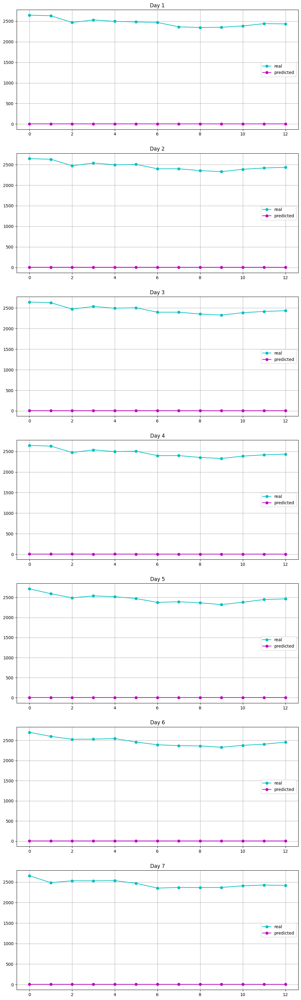

2458.8351000407324 
 [2461.3056298810357, 2458.3083702498416, 2458.3130627246437, 2458.317873693253, 2462.908802654758, 2462.0797896391973, 2450.5914294707113]


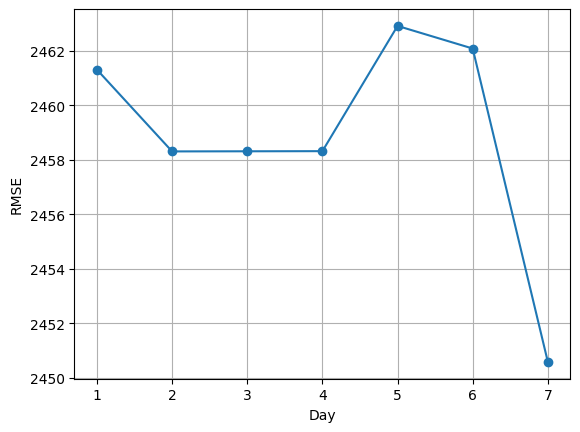

In [ ]:
n_input=7
n_steps=n_input//n_length
model=convlstm_model(tf.keras.layers.LSTM,n_length,n_steps)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
X_train=X_train.reshape((X_train.shape[0],n_steps,1,n_length,n_features))
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es])
score,scores=evaluate_model_convlstm(model,data_train,data_test,n_steps,n_length,n_input)
print(score[0],'\n',scores[0])
plot_error_days(scores)

#### **14 days**

Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_lstm2d_13 (ConvLSTM2D)     │ (None, 1, 7, 32)       │         8,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_25 (Flatten)            │ (None, 224)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_25 (RepeatVector) │ (None, 7, 224)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_13 (LSTM)                  │ (None, 7, 8)           │         7,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_50             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_51             │ (None, 7, 2)           │            18 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,378 (63.98 KB)

 Trainable params: 16,378 (63.98 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step - loss: 71465840.0000
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 68710832.0000
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 36990032.0000
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 15625999.0000
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3101949.0000
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1209663.2500
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 615758.1875
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 404948.6562
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 308022.0312
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 291471.4688
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214420.6719
Epoch 12/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 199502.2188
Epoch 13/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 163732.1250
Epoch 14/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 141189.3906
Epoc

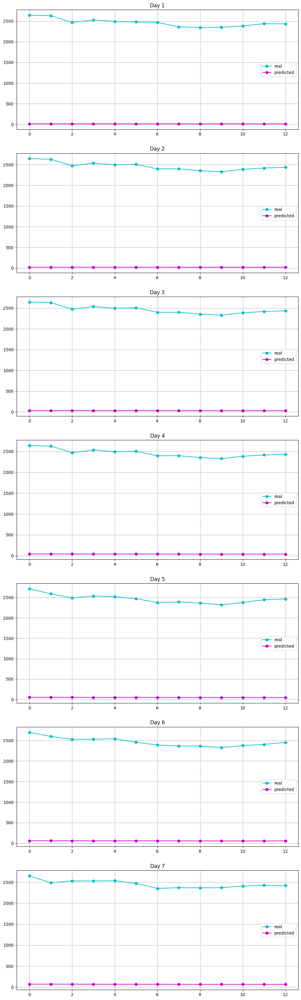

2425.7659965283524 
 [2456.723896303029, 2444.1734215740976, 2434.628987339449, 2425.1110459912015, 2420.2126264049734, 2409.912076769949, 2388.9791555898933]


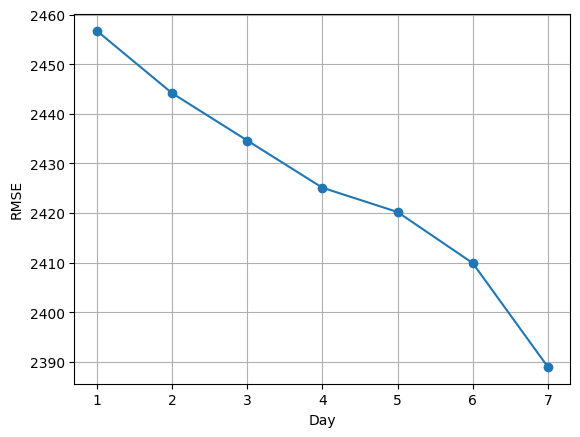

In [ ]:
n_input=14
n_steps=n_input//n_length
model=convlstm_model(tf.keras.layers.LSTM,n_length,n_steps)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
X_train=X_train.reshape((X_train.shape[0],n_steps,1,n_length,n_features))
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es])
score,scores=evaluate_model_convlstm(model,data_train,data_test,n_steps,n_length,n_input)
print(score[0],'\n',scores[0])
plot_error_days(scores)

### **GRU**

#### **7 days**

Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_lstm2d_14 (ConvLSTM2D)     │ (None, 1, 7, 32)       │         8,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_26 (Flatten)            │ (None, 224)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_26 (RepeatVector) │ (None, 7, 224)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_14 (LSTM)                  │ (None, 7, 8)           │         7,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_52             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_53             │ (None, 7, 2)           │            18 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,378 (63.98 KB)

 Trainable params: 16,378 (63.98 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 70630856.0000
Epoch 2/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 45113136.0000
Epoch 3/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 31667662.0000
Epoch 4/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 21304378.0000
Epoch 5/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 12865615.0000
Epoch 6/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 8784851.0000
Epoch 7/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6407141.0000
Epoch 8/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7281431.0000
Epoch 9/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5865375.5000
Epoch 10/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3694252.7500
Epoch 11/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3498052.0000
Epoch 12/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3342353.2500
Epoch 13/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3128322.0000
Epoch 14/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 2888211.7

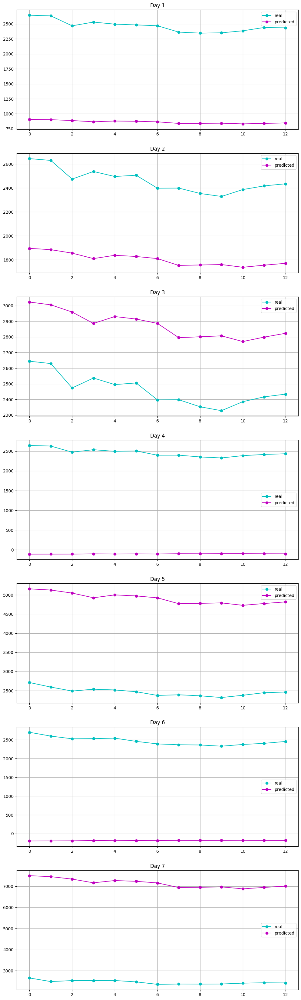

2529.065791200726 
 [1603.3353909345817, 660.5630567247321, 417.62209062997584, 2567.5708673608233, 2444.1509778110158, 2652.4334419357306, 4689.358481720468]


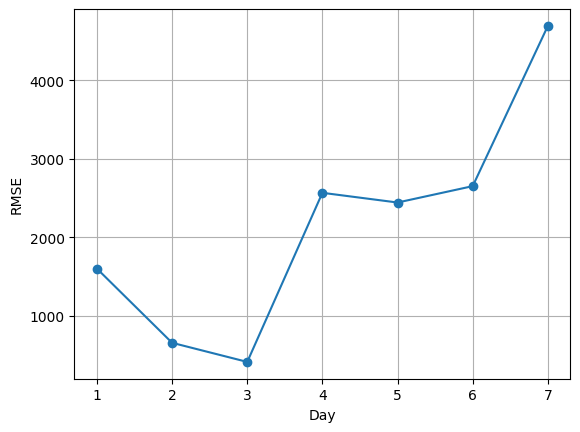

In [ ]:
n_input=7
n_steps=n_input//n_length
model=convlstm_model(tf.keras.layers.LSTM,n_length,n_steps)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
X_train=X_train.reshape((X_train.shape[0],n_steps,1,n_length,n_features))
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es])
score,scores=evaluate_model_convlstm(model,data_train,data_test,n_steps,n_length,n_input)
print(score[0],'\n',scores[0])
plot_error_days(scores)

#### **14 days**

Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_lstm2d_15 (ConvLSTM2D)     │ (None, 1, 7, 32)       │         8,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_27 (Flatten)            │ (None, 224)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_27 (RepeatVector) │ (None, 7, 224)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_15 (LSTM)                  │ (None, 7, 8)           │         7,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_54             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_55             │ (None, 7, 2)           │            18 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,378 (63.98 KB)

 Trainable params: 16,378 (63.98 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 8s 41ms/step - loss: 71748384.0000
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 62978536.0000
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 52782404.0000
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 28937642.0000
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3594347.2500
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 144949.8125
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 121349.3281
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 114902.2812
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 106219.9688
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 109267.4609
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 108115.2188
Epoch 12/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 103628.7422
Epoch 13/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 91106.5859
Epoch 14/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 92292.5078
Epoch 1

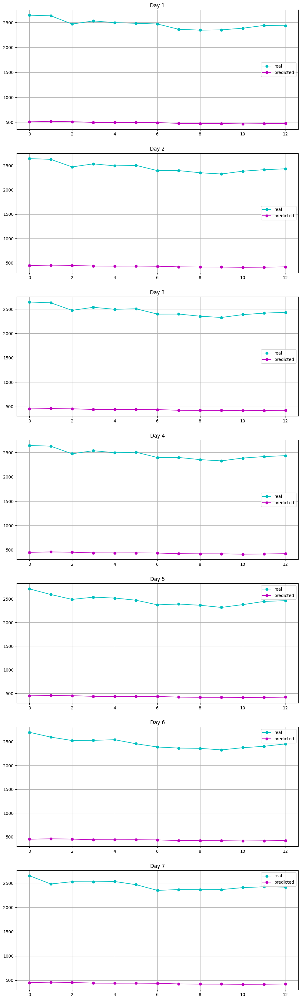

2023.9812222272624 
 [1976.7588963716842, 2038.0334836513123, 2029.570171275053, 2030.653110808549, 2035.147722142526, 2034.26055934799, 2022.7689659980547]


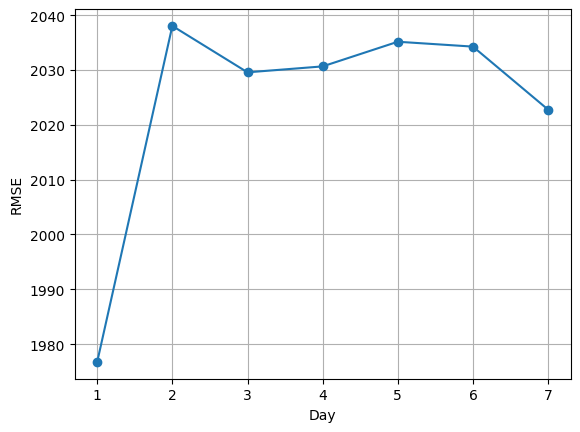

In [ ]:
n_input=14
n_steps=n_input//n_length
model=convlstm_model(tf.keras.layers.LSTM,n_length,n_steps)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
X_train=X_train.reshape((X_train.shape[0],n_steps,1,n_length,n_features))
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es])
score,scores=evaluate_model_convlstm(model,data_train,data_test,n_steps,n_length,n_input)
print(score[0],'\n',scores[0])
plot_error_days(scores)

## **Models with two ConvLSTM2D layers**

### **LSTM**

#### **7 days**

Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_lstm2d_16 (ConvLSTM2D)     │ (None, 1, 1, 7, 32)    │         8,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_lstm2d_17 (ConvLSTM2D)     │ (None, 1, 7, 32)       │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_28 (Flatten)            │ (None, 224)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_28 (RepeatVector) │ (None, 7, 224)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_16 (LSTM)                  │ (None, 7, 8)           │         7,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_56             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_57             │ (None, 7, 2)           │            18 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 32,890 (128.48 KB)

 Trainable params: 32,890 (128.48 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - loss: 70218008.0000
Epoch 2/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 49924572.0000
Epoch 3/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 30391414.0000
Epoch 4/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 9776839.0000 
Epoch 5/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3101240.5000
Epoch 6/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 691570.1250
Epoch 7/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 105192.2656
Epoch 8/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 47604.5156
Epoch 9/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 41364.3320
Epoch 10/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 39781.9375
Epoch 11/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 41723.1523
Epoch 12/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 47710.4922
Epoch 13/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 49649.4375
Epoch 14/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 43830.5000
Epoch 15/50
6

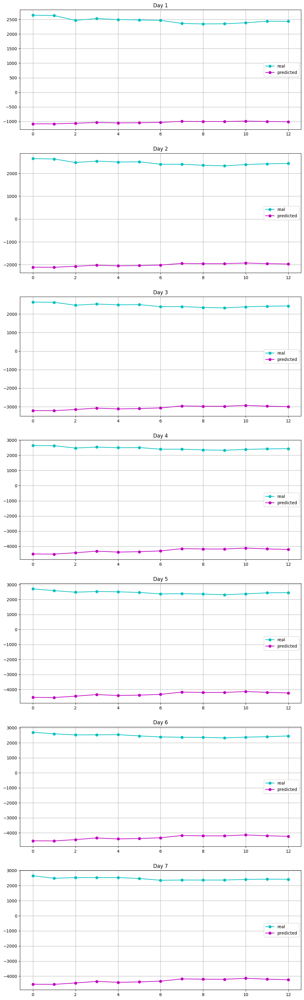

5934.80231458727 
 [3495.2423023352776, 4476.432558919513, 5522.279428961086, 6759.788902811623, 6789.171467291215, 6788.585737073337, 6777.161703991248]


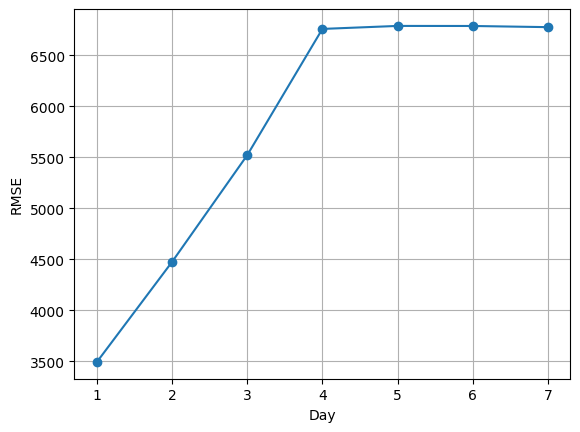

In [ ]:
n_input=7
n_steps=n_input//n_length
model=convlstm_two_layers_model(tf.keras.layers.LSTM,n_length,n_steps)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
X_train=X_train.reshape((X_train.shape[0],n_steps,1,n_length,n_features))
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es])
score,scores=evaluate_model_convlstm(model,data_train,data_test,n_steps,n_length,n_input)
print(score[0],'\n',scores[0])
plot_error_days(scores)

#### **14 days**

Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_lstm2d_18 (ConvLSTM2D)     │ (None, 2, 1, 7, 32)    │         8,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_lstm2d_19 (ConvLSTM2D)     │ (None, 1, 7, 32)       │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_29 (Flatten)            │ (None, 224)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_29 (RepeatVector) │ (None, 7, 224)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_17 (LSTM)                  │ (None, 7, 8)           │         7,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_58             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_59             │ (None, 7, 2)           │            18 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 32,890 (128.48 KB)

 Trainable params: 32,890 (128.48 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - loss: 69333152.0000
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 24719780.0000
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 18570032.0000
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 14940135.0000
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 11169649.0000
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8369790.0000
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 6725159.0000
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5462234.0000
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4389588.0000
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3368944.7500
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3927889.5000
Epoch 12/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3497358.7500
Epoch 13/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4764526.5000
Epoch 14/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4903758

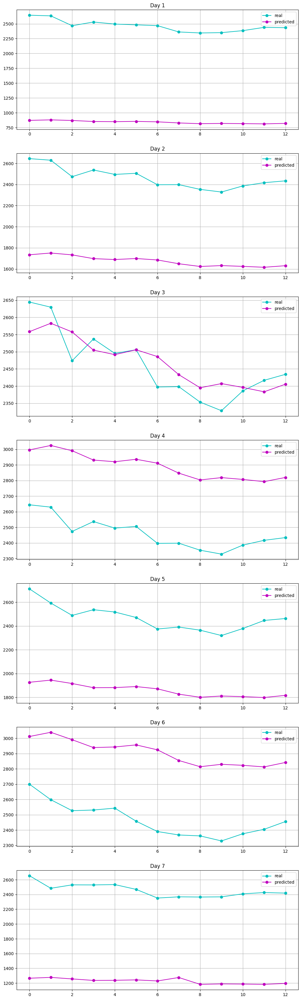

889.1056419744918 
 [1624.3551650571637, 789.8050860946776, 53.187114912477064, 433.9633956781564, 610.0596157315123, 445.1367778785001, 1228.725981706029]


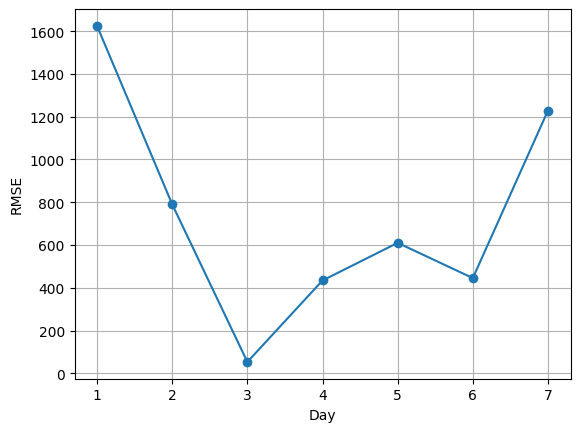

In [ ]:
n_input=14
n_steps=n_input//n_length
model=convlstm_two_layers_model(tf.keras.layers.LSTM,n_length,n_steps)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
X_train=X_train.reshape((X_train.shape[0],n_steps,1,n_length,n_features))
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es])
score,scores=evaluate_model_convlstm(model,data_train,data_test,n_steps,n_length,n_input)
print(score[0],'\n',scores[0])
plot_error_days(scores)

### **GRU**

#### **7 days**

Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_lstm2d_20 (ConvLSTM2D)     │ (None, 1, 1, 7, 32)    │         8,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_lstm2d_21 (ConvLSTM2D)     │ (None, 1, 7, 32)       │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_30 (Flatten)            │ (None, 224)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_30 (RepeatVector) │ (None, 7, 224)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_12 (GRU)                    │ (None, 7, 8)           │         5,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_60             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_61             │ (None, 7, 2)           │            18 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 31,050 (121.29 KB)

 Trainable params: 31,050 (121.29 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - loss: 68364040.0000
Epoch 2/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 19926272.0000
Epoch 3/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1172909.1250
Epoch 4/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 847800.5625
Epoch 5/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 650547.6250
Epoch 6/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 483134.1562
Epoch 7/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 339964.3438
Epoch 8/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250035.4531
Epoch 9/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 182516.1719
Epoch 10/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 130551.5469
Epoch 11/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 99542.4766 
Epoch 12/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 71277.6484
Epoch 13/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 52062.4727
Epoch 14/50
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 49768.1641
Epoch 15/50
6

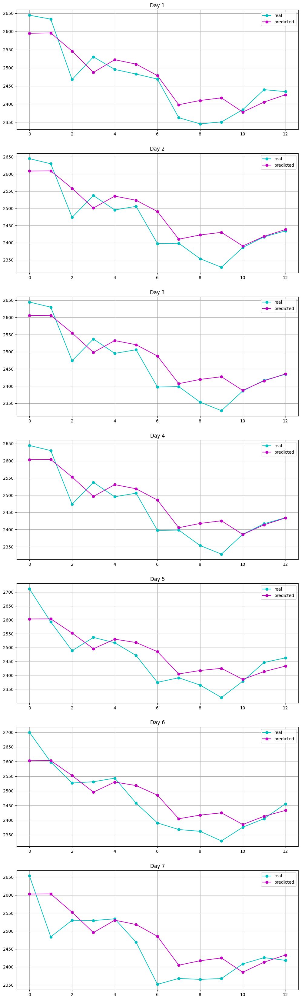

53.62099465167643 
 [43.438034285148966, 52.687502259222114, 51.24560619286203, 50.4650098007343, 60.94063480604021, 54.3315486673924, 60.20908765086865]


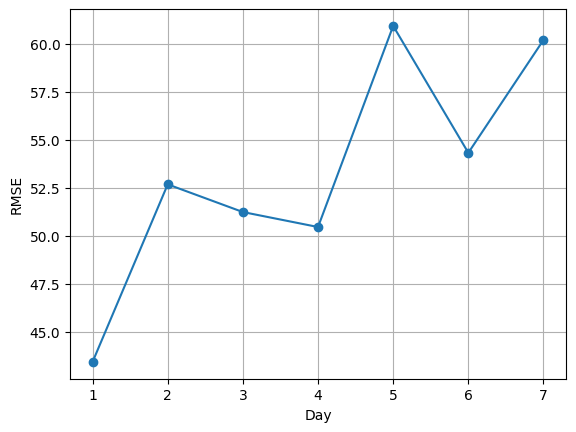

In [ ]:
n_input=7
n_steps=n_input//n_length
model=convlstm_two_layers_model(tf.keras.layers.GRU,n_length,n_steps)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
X_train=X_train.reshape((X_train.shape[0],n_steps,1,n_length,n_features))
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es])
score,scores=evaluate_model_convlstm(model,data_train,data_test,n_steps,n_length,n_input)
print(score[0],'\n',scores[0])
plot_error_days(scores)

#### **14 days**

Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_lstm2d_22 (ConvLSTM2D)     │ (None, 2, 1, 7, 32)    │         8,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_lstm2d_23 (ConvLSTM2D)     │ (None, 1, 7, 32)       │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_31 (Flatten)            │ (None, 224)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector_31 (RepeatVector) │ (None, 7, 224)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_13 (GRU)                    │ (None, 7, 8)           │         5,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_62             │ (None, 7, 8)           │            72 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_63             │ (None, 7, 2)           │            18 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 31,050 (121.29 KB)

 Trainable params: 31,050 (121.29 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 61756796.0000
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1999417.1250
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 119204.3594
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 89566.6562
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 76159.1250
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 73592.6797
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 77117.5312
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 78049.3047
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 66710.4297
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 68927.4453
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 74646.2969
Epoch 12/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 69907.1484
Epoch 13/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 72438.0703
Epoch 14/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 66409.9766
Epoch 15/50
64/64 ━━━

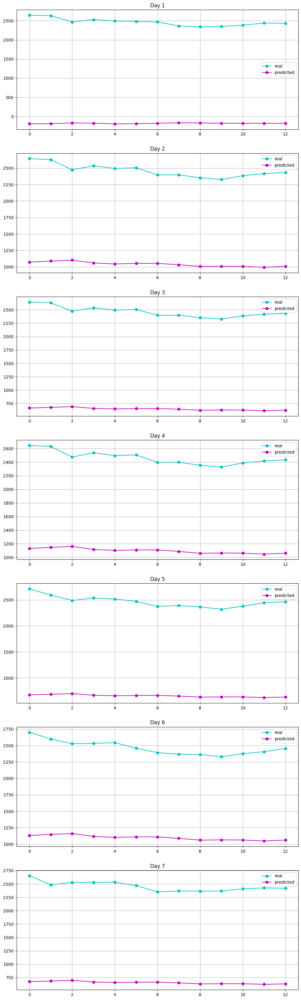

1797.1016202960618 
 [2647.492712704797, 1423.2870657740127, 1816.3861404128736, 1366.1906861356708, 1813.237061126778, 1369.631390663299, 1800.7224972684498]


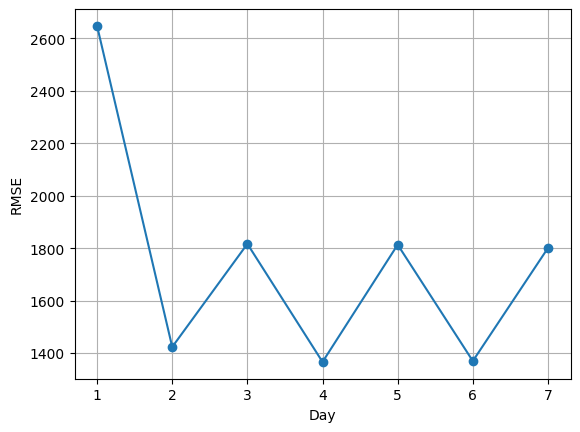

In [ ]:
n_input=14
n_steps=n_input//n_length
model=convlstm_two_layers_model(tf.keras.layers.GRU,n_length,n_steps)
model.summary()
X_train,y_train=create_dataset(data_train,n_input)
X_train=X_train.reshape((X_train.shape[0],n_steps,1,n_length,n_features))
hist=model.fit(X_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[es])
score,scores=evaluate_model_convlstm(model,data_train,data_test,n_steps,n_length,n_input)
print(score[0],'\n',scores[0])
plot_error_days(scores)